<h1>Project Title: Predicting Blood Supply  Units (Number of Blood Donations) for Effective Resource Management in Malaysia</h1>

<h3>1. INTRODUCTION</h3>

The primary objective of this project is to identify the blood type that will have the highest donation/supply units in each state, on a monthly basis. This information will be instrumental in guiding the blood donation campaign committee and blood bank staff in their planning and decision-making processes. Understanding these trends will enable better preparation for high-demand periods and ensure that blood supplies are managed efficiently.

<h4>1.1 Project Overview</h4>

Blood donation is a critical aspect of healthcare systems, ensuring that hospitals and clinics have a steady supply of blood to meet the needs of patients. In Malaysia, managing blood supplies effectively requires understanding donation patterns and predicting future trends. As a Supply Planner, my role is to develop a forecasting model that predicts blood donation/supply units for various blood types across different states in Malaysia. This will enable the blood donation campaign committee and blood bank staff to make informed decisions and plan accordingly.

<h4>1.2 Problem Statement</h4>

There is a significant gap in forecasting blood donation units for different blood types across various states in Malaysia on a monthly basis. Without accurate predictions, blood banks and donation campaign committees face difficulties in optimizing resource allocation, planning targeted campaigns, and ensuring that blood supplies meet patient demands efficiently.

<h4>1.3 DataSet Description</h4> 

#### Dataset Title: Blood Donations by State

**Source:** Data.gov.my

#### Overview
The dataset provides detailed records of blood donations across various states in Malaysia. It includes information on donation counts for different blood types, allowing for an understanding of donation trends and patterns within specific regions and time periods.

#### Key Components

- **States:**  
  The dataset includes blood donation data for each state in Malaysia, such as Johor and others.

- **Blood Types:**  
  Data is available for multiple blood types, which may include:
  - Type A
  - Type B
  - Type AB
  - Type O

- **Time Period:**  
  The dataset includes monthly records, enabling temporal analysis of donation trends.

- **Columns:**
  - **State:** The state in Malaysia where the donations were recorded.
  - **Blood Type:** The specific type of blood donated.
  - **Year:** The year in which the donations were made.
  - **Month:** The month in which the donations were made.
  - **Donation Count:** The total number of donations for each blood type within the specified state, year, and month.

#### Purpose
The dataset aims to provide insights into blood donation trends across different states and time periods. It can be used for:
- Analyzing donation patterns.
- Forecasting future blood donations/supply units.
- Planning blood donation campaigns and resource allocation.

#### Usage
The data can be leveraged to:
- Analyze trends in blood donations across different types and states.
- Develop forecasting models to predict future donation units (number of blood supply).
- Support resource planning and campaign strategies for blood banks and donation organizations.

By utilizing this dataset, organizations can enhance their understanding of blood donation dynamics, leading to more effective planning and operational efficiency.


<h4>1.4 Objectives</h4>

The main objective of this project is to create a predictive model that forecasts monthly blood supply units for each blood type in Malaysia's states. By doing so, we aim to:

- Identify trends in blood donation rates for different blood types.
- Determine which blood type will have the highest blood supply(in units) in each state.
- Provide actionable insights to the blood donation campaign committee and blood bank staff to optimize resource allocation and planning.

<h4>1.5 Hypothesis</h4>

#### Hypothesis: Blood Type O Consistently Has the Highest Donation Units (blood supply)

**Statement:**  
Blood type O will consistently have the highest blood donation units compared to other blood types across various states in Malaysia, based on historical donation data.

#### Rationale

1. **Historical Data Consistency:**  
   Historical data may reveal a consistent trend where blood type O has higher donation units compared to other blood types. This trend could be attributed to the universal donor status of blood type O, which may encourage more donations.

2. **Demand and Usage:**  
   Blood type O is often in high demand because it is universally compatible with all other blood types for transfusions. This increased demand may result in a higher rate of donations for this blood type. 

3. **Donor Preferences:**  
   Donors might have a higher tendency to donate blood type O, potentially due to awareness of its universal compatibility or other factors influencing donor behavior. 

4. **Campaign Effectiveness:**  
   Blood donation campaigns and initiatives might be more effective in promoting donations of blood type O due to its broad applicability, leading to higher donation units.


<h3>2. DATA LOADING AND EXPLORATION</h3>

<h4>2.1 Data Import</h4>

In [1]:
# Import necessary libraries
import pandas as pd #used for data manipulation and analysis
import numpy as np #provides support for numerical operations and arrays
import matplotlib.pyplot as plt #used for creating static, interactive, and animated visualizations in Python.
import seaborn as sns #provides a high-level interface for drawing attractive and informative statistical graphics

from sklearn.preprocessing import LabelEncoder #convert categorical labels into numerical values

from sklearn.model_selection import train_test_split #split data into training and testing sets
from sklearn.linear_model import LinearRegression #used to fit a linear model to the data
from sklearn.tree import DecisionTreeRegressor #used to build a decision tree regressor model
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor #used to create ensemble models that combine the predictions of multiple decision trees
from sklearn.svm import SVR #to fit a regression model using support vector machines
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score #mean_absolute_error: Calculates the average absolute errors between predicted and actual values.
#mean_squared_error: Calculates the average squared errors between predicted and actual values.
#r2_score: Measures the proportion of variance in the dependent variable that is predictable from the independent variables.
from sklearn.model_selection import cross_val_score #cross-validation and provides a score for each fold
from sklearn.preprocessing import StandardScaler #to standardize features by removing the mean and scaling to unit variance
from sklearn.multioutput import MultiOutputRegressor #to handle multi-output regression problems by fitting one regressor per target variable
from sklearn.pipeline import Pipeline #to assemble multiple steps into a single pipeline for streamlined preprocessing and modeling
from sklearn.model_selection import GridSearchCV #used for hyperparameter tuning by exhaustively searching through a specified parameter grid

import pickle #provides functions for serializing and deserializing Python objects (deployment into a web system)

In [2]:
data = pd.read_csv('blood_donations.csv')
data

,date,state,blood_type,donations
0,2006-01-01,Johor,all,87
1,2006-01-02,Johor,all,15
2,2006-01-03,Johor,all,8
3,2006-01-04,Johor,all,33
4,2006-01-05,Johor,all,20
...,...,...,...,...
444075,2024-09-10,W.P. Kuala Lumpur,ab,25
444076,2024-09-11,W.P. Kuala Lumpur,ab,26
444077,2024-09-12,W.P. Kuala Lumpur,ab,36
444078,2024-09-13,W.P. Kuala Lumpur,ab,35


<h4>2.2 Data Overview</h4>

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 444080 entries, 0 to 444079
Data columns (total 4 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   date        444080 non-null  object
 1   state       444080 non-null  object
 2   blood_type  444080 non-null  object
 3   donations   444080 non-null  int64 
dtypes: int64(1), object(3)
memory usage: 13.6+ MB


In [4]:
data.head()

,date,state,blood_type,donations
0,2006-01-01,Johor,all,87
1,2006-01-02,Johor,all,15
2,2006-01-03,Johor,all,8
3,2006-01-04,Johor,all,33
4,2006-01-05,Johor,all,20


In [5]:
data.tail()

,date,state,blood_type,donations
444075,2024-09-10,W.P. Kuala Lumpur,ab,25
444076,2024-09-11,W.P. Kuala Lumpur,ab,26
444077,2024-09-12,W.P. Kuala Lumpur,ab,36
444078,2024-09-13,W.P. Kuala Lumpur,ab,35
444079,2024-09-14,W.P. Kuala Lumpur,ab,19


In [6]:
data.describe()

,donations
count,444080.000000
mean,39.023926
std,82.105162
min,0.000000
25%,3.000000
50%,14.000000
75%,39.000000
max,2667.000000


<h3>3. DATA CLEANING AND PREPROCESSING</h3>

In [7]:
#there will be more data cleaning and preprocessing in Machine Learing section as there will be many datasets/features...
#...that will be added/merged along the way to create the best model

In [8]:
# Ensure the 'date' column is in datetime format
data['date'] = pd.to_datetime(data['date'], errors='coerce')

In [9]:
# Drop all rows where 'date' is in September 2024 because this month is not over yet
data = data[~((data['date'].dt.year == 2024) & (data['date'].dt.month == 9))]
data

,date,state,blood_type,donations
0,2006-01-01,Johor,all,87
1,2006-01-02,Johor,all,15
2,2006-01-03,Johor,all,8
3,2006-01-04,Johor,all,33
4,2006-01-05,Johor,all,20
...,...,...,...,...
444061,2024-08-27,W.P. Kuala Lumpur,ab,27
444062,2024-08-28,W.P. Kuala Lumpur,ab,31
444063,2024-08-29,W.P. Kuala Lumpur,ab,29
444064,2024-08-30,W.P. Kuala Lumpur,ab,25


In [10]:
data_by_state = data.groupby('state').agg({
    'donations': 'sum'  
}).sort_values(by='donations', ascending=False)

data_by_state

,donations
state,
W.P. Kuala Lumpur,6483952
Kedah,1581967
Perak,1275412
Johor,1195572
Melaka,1013053
Sarawak,984351
Sabah,967015
Selangor,901437
Pulau Pinang,839481


In [11]:
data_by_blood_type = data.groupby('blood_type').agg({
    'donations': 'sum'  
}).sort_values(by='donations', ascending=False)

data_by_blood_type

,donations
blood_type,
all,8643074
o,3606946
b,2352763
a,2146468
ab,536678


In [12]:
# Create a copy of the DataFrame to avoid SettingWithCopyWarning
data_copy = data.copy()

# Ensure 'date' column is in datetime format
data_copy['date'] = pd.to_datetime(data_copy['date'], errors='coerce')

# Safely extract year and month using .loc on the copy
data_copy['year'] = data_copy['date'].dt.year
data_copy['month'] = data_copy['date'].dt.month

# Group by 'year' and 'month' and aggregate donations
data_by_month = data_copy.groupby(['year', 'month']).agg({
    'donations': 'sum'
})

# Reset the index to flatten the dataframe
data_by_month = data_by_month.reset_index()

data_by_month.head(12)


,year,month,donations
0,2006,1,30054
1,2006,2,39200
2,2006,3,43047
3,2006,4,33149
4,2006,5,40527
5,2006,6,29754
6,2006,7,39702
7,2006,8,41820
8,2006,9,42956
9,2006,10,23295


In [13]:
data_by_month.tail(8)

,year,month,donations
216,2024,1,98667
217,2024,2,93732
218,2024,3,103582
219,2024,4,85734
220,2024,5,107420
221,2024,6,100305
222,2024,7,95333
223,2024,8,99414


In [14]:
# Drop rows where blood_type is 'all' for a better analysis
data = data[data['blood_type'] != 'all']
data

,date,state,blood_type,donations
88816,2006-01-01,Johor,a,19
88817,2006-01-02,Johor,a,4
88818,2006-01-03,Johor,a,2
88819,2006-01-04,Johor,a,7
88820,2006-01-05,Johor,a,3
...,...,...,...,...
444061,2024-08-27,W.P. Kuala Lumpur,ab,27
444062,2024-08-28,W.P. Kuala Lumpur,ab,31
444063,2024-08-29,W.P. Kuala Lumpur,ab,29
444064,2024-08-30,W.P. Kuala Lumpur,ab,25


In [15]:
# Create a copy of the original DataFrame to avoid the SettingWithCopyWarning
data_copy = data.copy()

# Ensure 'date' column is in datetime format
data_copy['date'] = pd.to_datetime(data_copy['date'], errors='coerce')

# Safely extract year and month from 'date'
data_copy['year'] = data_copy['date'].dt.year
data_copy['month'] = data_copy['date'].dt.month

# Group by 'year', 'month', 'state', and 'blood_type' and sum donations
monthly_donations = data_copy.groupby(['year', 'month', 'state', 'blood_type']).agg({
    'donations': 'sum'
}).reset_index()

# Drop the 'date' column (if it exists) - but this should already be absent since it's not part of the groupby
if 'date' in monthly_donations.columns:
    monthly_donations = monthly_donations.drop(columns=['date'])

monthly_donations

,year,month,state,blood_type,donations
0,2006,1,Johor,a,217
1,2006,1,Johor,ab,56
2,2006,1,Johor,b,209
3,2006,1,Johor,o,342
4,2006,1,Kedah,a,654
...,...,...,...,...,...
11643,2024,8,Terengganu,o,757
11644,2024,8,W.P. Kuala Lumpur,a,4302
11645,2024,8,W.P. Kuala Lumpur,ab,981
11646,2024,8,W.P. Kuala Lumpur,b,4652


In [16]:
# Month that has the maximum values of total donations (across the same month and year)
max_donations_row = monthly_donations.loc[monthly_donations['donations'].idxmax()]
max_donations_month = max_donations_row[['year', 'month']]

max_donations_month

year     2024
month       5
Name: 11491, dtype: object

In [17]:
# Month that has the minimum values of total donations (across the same month and year)
min_donations_row = monthly_donations.loc[monthly_donations['donations'].idxmin()]
min_donations_month = min_donations_row[['year', 'month']]

min_donations_month

year     2006
month       1
Name: 16, dtype: object

In [18]:
# Blood type that has the highest values of total donations
blood_type_donations = monthly_donations.groupby('blood_type').agg({'donations': 'sum'}).reset_index()
max_blood_type_row = blood_type_donations.loc[blood_type_donations['donations'].idxmax()]
max_blood_type = max_blood_type_row['blood_type']

max_blood_type

'o'

In [19]:
# Blood type that has the lowest values of total donations
min_blood_type_row = blood_type_donations.loc[blood_type_donations['donations'].idxmin()]
min_blood_type = min_blood_type_row['blood_type']

min_blood_type

'ab'

In [20]:
# State that has the highest values of total donations
state_donations = monthly_donations.groupby('state').agg({'donations': 'sum'}).reset_index()
max_state_row = state_donations.loc[state_donations['donations'].idxmax()]
max_state = max_state_row['state']

max_state

'W.P. Kuala Lumpur'

In [21]:
# State that has the lowest values of total donations
min_state_row = state_donations.loc[state_donations['donations'].idxmin()]
min_state = min_state_row['state']

min_state

'Kelantan'

<h4>3.1 Missing Values</h4>

In [22]:
# Group by 'state', 'year', and 'month' and sum donations
state_monthly_donations = monthly_donations.groupby(['state', 'year', 'month']).agg({'donations': 'sum'}).reset_index()

# Filter to find the states with zero donations for all blood types in a month
zero_donations_states = state_monthly_donations[state_monthly_donations['donations'] == 0]

zero_donations_states

,state,year,month,donations
582,Kelantan,2017,3,0
583,Kelantan,2017,4,0
584,Kelantan,2017,5,0
587,Kelantan,2017,8,0
590,Kelantan,2017,11,0
...,...,...,...,...
1662,Pulau Pinang,2013,11,0
1663,Pulau Pinang,2013,12,0
1664,Pulau Pinang,2014,1,0
1665,Pulau Pinang,2014,2,0


In [23]:
state_counts = zero_donations_states['state'].value_counts()

# Get the state with the most occurrences
state_counts.idxmax()


'Pulau Pinang'

In [24]:
# Sort states from most to least occurrences
sorted_states = state_counts.index

print("States sorted from most to least occurrences:")
print(sorted_states)

States sorted from most to least occurrences:
Index(['Pulau Pinang', 'Kelantan', 'Negeri Sembilan', 'Perak'], dtype='object', name='state')


In [25]:
# Group by 'state', 'year', 'month', and 'blood_type' and sum donations
state_monthly_donations = monthly_donations.groupby(['state', 'year', 'month', 'blood_type']).agg({'donations': 'sum'}).reset_index()

# Group by 'state', 'year', and 'month' to find total donations across all blood types
total_state_monthly_donations = state_monthly_donations.groupby(['state', 'year', 'month']).agg({'donations': 'sum'}).reset_index()

# Filter to find the states with zero donations across all blood types in any month
zero_donations = total_state_monthly_donations[total_state_monthly_donations['donations'] == 0]

# Sort by 'year' and 'month' in descending order to find the last occurrence
last_zero_donations = zero_donations.sort_values(by=['year', 'month'], ascending=[False, False]).head(1)

last_zero_donations

,state,year,month,donations
591,Kelantan,2017,12,0


In [26]:
#check if 2017 is the last year where there is a state without blood donation

In [249]:
monthly_donations

,year,month,state,blood_type,donations,year-month
0,2018,1,Johor,a,768,2018-01
1,2018,1,Johor,ab,198,2018-01
2,2018,1,Johor,b,986,2018-01
3,2018,1,Johor,o,1450,2018-01
4,2018,1,Kedah,a,1360,2018-01
...,...,...,...,...,...,...
4155,2024,8,Terengganu,o,757,2024-08
4156,2024,8,W.P. Kuala Lumpur,a,4302,2024-08
4157,2024,8,W.P. Kuala Lumpur,ab,981,2024-08
4158,2024,8,W.P. Kuala Lumpur,b,4652,2024-08


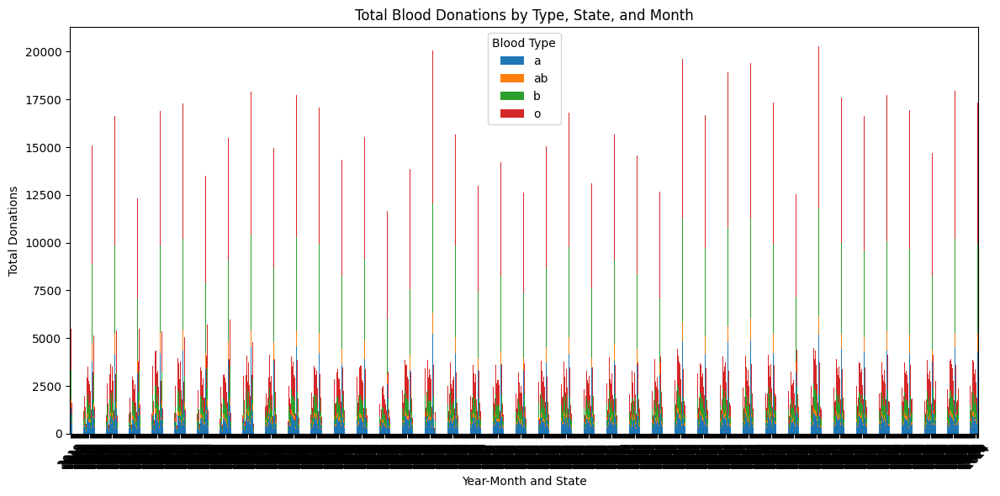

In [254]:
# Group by year, month, state, and blood type to get total donations
grouped_data = monthly_donations.groupby(['year-month', 'state', 'blood_type']).sum().reset_index()

# Create a pivot table for plotting
pivot_datamonth = grouped_data.pivot_table(values='donations', 
                                      index=['year-month', 'state'], 
                                      columns='blood_type', 
                                      fill_value=0)

# Plotting
ax = pivot_datamonth.plot(kind='bar', stacked=True, figsize=(12, 6))

# Customize x-tick labels to show only the year
xticks = [f"{year_month.split('-')[0]}" for year_month in pivot_datamonth.index.get_level_values(0)]
ax.set_xticklabels(xticks, rotation=45)

plt.title('Total Blood Donations by Type, State, and Month')
plt.xlabel('Year-Month and State')
plt.ylabel('Total Donations')
plt.legend(title='Blood Type')
plt.tight_layout()
plt.show()

In [27]:
# Filter data for the year 2017
data_2017 = monthly_donations[monthly_donations['year'] == 2017]

# Group by 'state' and 'month' and sum donations
donations_per_month_2017 = data_2017.groupby(['state', 'month']).agg({'donations': 'sum'}).reset_index()



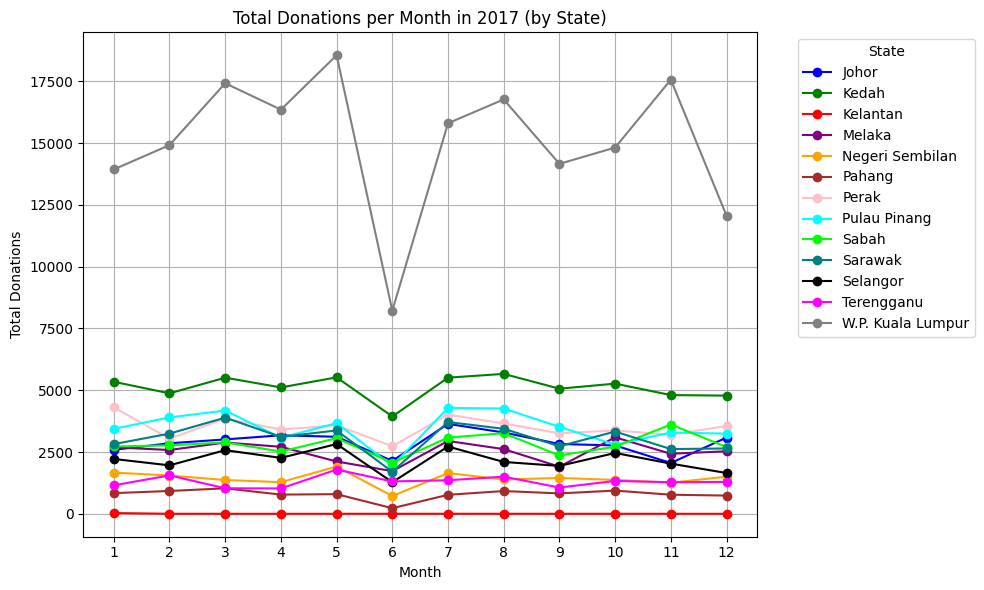

In [28]:
# Define custom colors for each state (including Sabah and Sarawak)
state_colors = {
    'Johor': 'blue',
    'Kedah': 'green',
    'Kelantan': 'red',
    'Melaka': 'purple',
    'Negeri Sembilan': 'orange',
    'Pahang': 'brown',
    'Pulau Pinang': 'cyan',

    'Perak': 'pink',
    'Perlis': 'yellow',
    'Selangor': 'black',
    'Terengganu': 'magenta',
    'W.P. Kuala Lumpur': 'gray',
    'Sabah': 'lime',
    'Sarawak': 'teal'
}

# Plotting
plt.figure(figsize=(10, 6))

# Plot for each state using the assigned color
for state in donations_per_month_2017['state'].unique():
    state_data = donations_per_month_2017[donations_per_month_2017['state'] == state]
    plt.plot(state_data['month'], state_data['donations'], marker='o', label=state, color=state_colors.get(state, 'black'))  # Use 'black' if the state isn't in the dictionary

# Add labels and title
plt.xlabel('Month')
plt.ylabel('Total Donations')
plt.title('Total Donations per Month in 2017 (by State)')
plt.xticks(range(1, 13))  # Ensure we only have months 1-12 on x-axis
plt.grid(True)

# Add legend
plt.legend(title='State', bbox_to_anchor=(1.05, 1), loc='upper left')

# Display the plot
plt.tight_layout()
plt.show()

In [29]:
#Check if year 2018 is the first year where all states are involved in blood donations

In [30]:
# Filter data for the year 2018
data_2018 = monthly_donations[monthly_donations['year'] == 2018]

# Group by 'state' and 'month' and sum donations
donations_per_month_2018 = data_2018.groupby(['state', 'month']).agg({'donations': 'sum'}).reset_index()

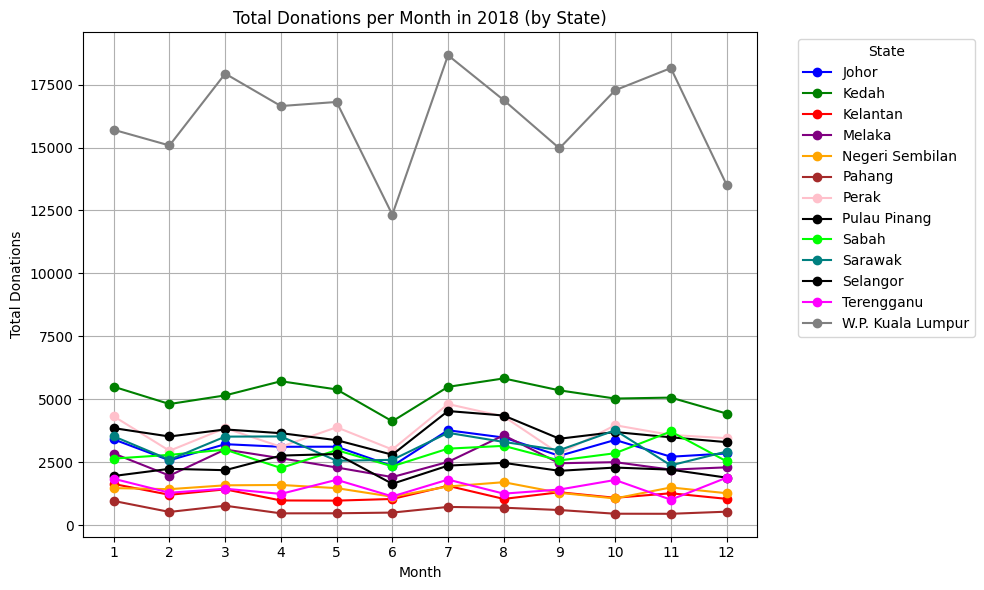

In [31]:
# Define custom colors for each state (including Sabah and Sarawak)
state_colors = {
    'Johor': 'blue',
    'Kedah': 'green',
    'Kelantan': 'red',

    'Melaka': 'purple',
    'Negeri Sembilan': 'orange',
    'Pahang': 'brown',
    'Penang': 'cyan',
    'Perak': 'pink',
    'Perlis': 'yellow',
    'Selangor': 'black',
    'Terengganu': 'magenta',
    'W.P. Kuala Lumpur': 'gray',
    'Sabah': 'lime',
    'Sarawak': 'teal'
}

# Plotting
plt.figure(figsize=(10, 6))

# Plot for each state using the assigned color
for state in donations_per_month_2018['state'].unique():
    state_data = donations_per_month_2018[donations_per_month_2018['state'] == state]
    plt.plot(state_data['month'], state_data['donations'], marker='o', label=state, color=state_colors.get(state, 'black'))  # Use 'black' if the state isn't in the dictionary

# Add labels and title
plt.xlabel('Month')
plt.ylabel('Total Donations')
plt.title('Total Donations per Month in 2018 (by State)')
plt.xticks(range(1, 13))  # Ensure we only have months 1-12 on x-axis
plt.grid(True)

# Add legend
plt.legend(title='State', bbox_to_anchor=(1.05, 1), loc='upper left')

# Display the plot
plt.tight_layout()
plt.show()

In [32]:
# Drop rows where the date is between '2006-01-01' and '2017-12-31' because starting in 2018, only then all states started getting involved

monthly_donations = monthly_donations[~((monthly_donations['year'] >= 2006) & (monthly_donations['year'] <= 2017))]
monthly_donations = monthly_donations.reset_index(drop=True)

monthly_donations

,year,month,state,blood_type,donations
0,2018,1,Johor,a,768
1,2018,1,Johor,ab,198
2,2018,1,Johor,b,986
3,2018,1,Johor,o,1450
4,2018,1,Kedah,a,1360
...,...,...,...,...,...
4155,2024,8,Terengganu,o,757
4156,2024,8,W.P. Kuala Lumpur,a,4302
4157,2024,8,W.P. Kuala Lumpur,ab,981
4158,2024,8,W.P. Kuala Lumpur,b,4652


In [33]:
# List all month that has 0 values of donations for all blood type in any state

# Group by 'state' and 'date', and sum donations across all blood types
state_date_donations = monthly_donations.groupby(['state', 'year', 'month']).agg({'donations': 'sum'}).reset_index()

# Filter rows where the total donations for all blood types is 0
zero_donations_rows = state_date_donations[state_date_donations['donations'] == 0]

# Check if there are any rows with 0 donations for all blood types
if not zero_donations_rows.empty:
    print("There are ", len(zero_donations_rows), "month where all blood types have 0 donations.")
    print(zero_donations_rows)
else:
    print("No month found with 0 donations for all blood types.")

No month found with 0 donations for all blood types.


In [34]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 354536 entries, 88816 to 444065
Data columns (total 4 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   date        354536 non-null  datetime64[ns]
 1   state       354536 non-null  object        
 2   blood_type  354536 non-null  object        
 3   donations   354536 non-null  int64         
dtypes: datetime64[ns](1), int64(1), object(2)
memory usage: 13.5+ MB


<h3>4. EXPLORATORY DATA ANALYSIS</h3>

In [35]:
#there will be more EDA in Machine Learing section as there will be many datasets/features...
#...that will be added/merged along the way to create the best model

<h4>4.1 Descriptive Statistics</h4>

In [36]:
data.describe()

,date,donations
count,354536,354536.000000
mean,2015-05-02 12:00:00,24.377933
min,2006-01-01 00:00:00,0.000000
25%,2010-09-01 00:00:00,2.000000
50%,2015-05-02 12:00:00,10.000000
75%,2020-01-01 00:00:00,27.000000
max,2024-08-31 00:00:00,1048.000000
std,NaN,43.524034


<h4>4.2 Feature Analysis and Visualisation</h4>

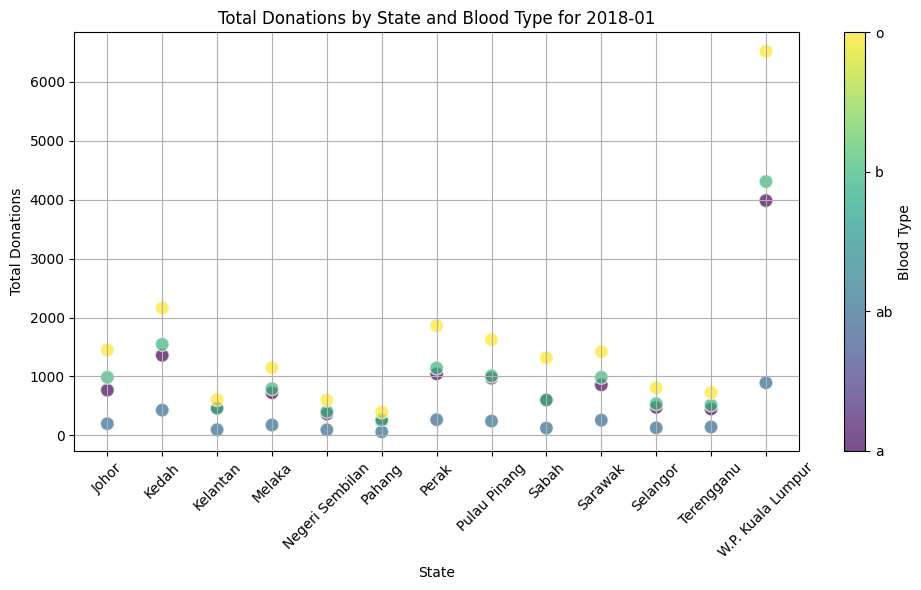

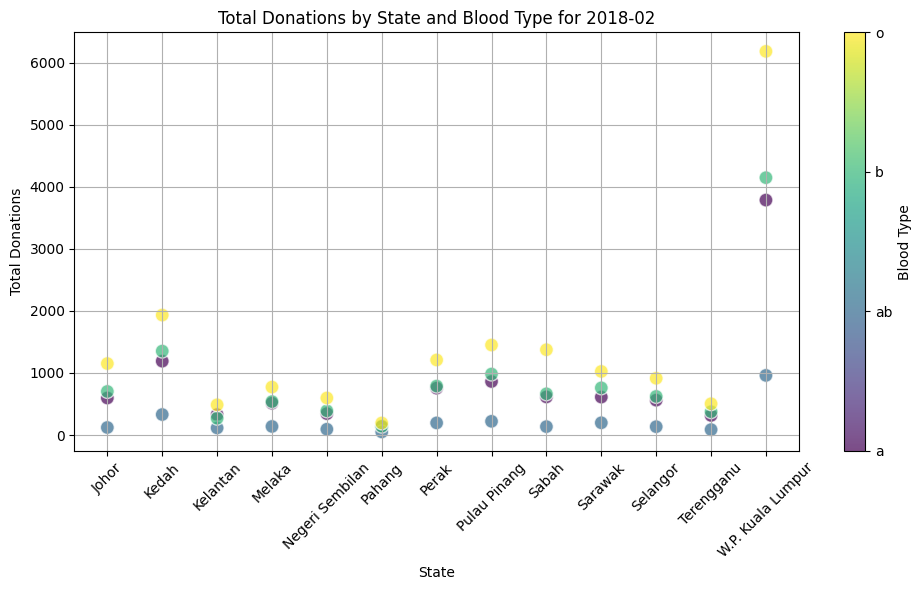

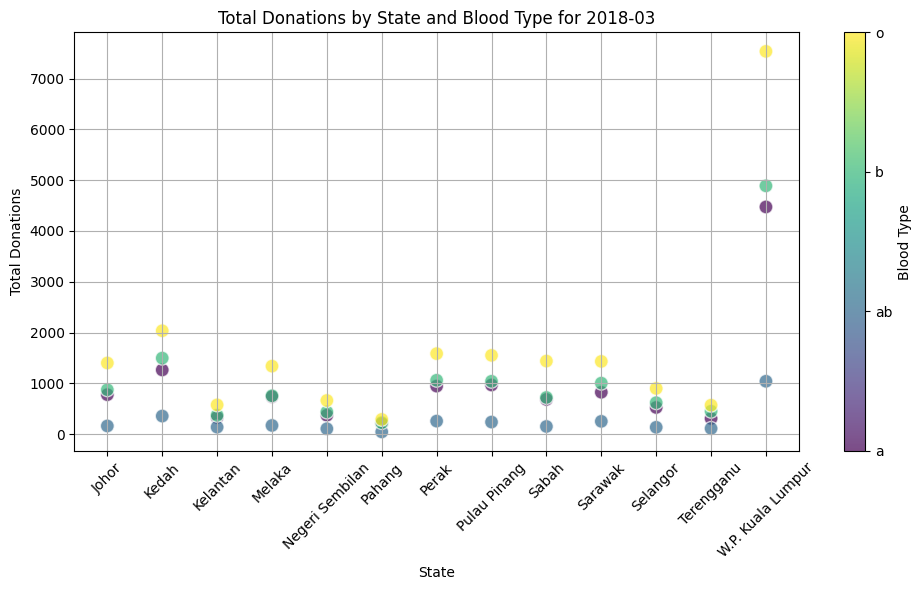

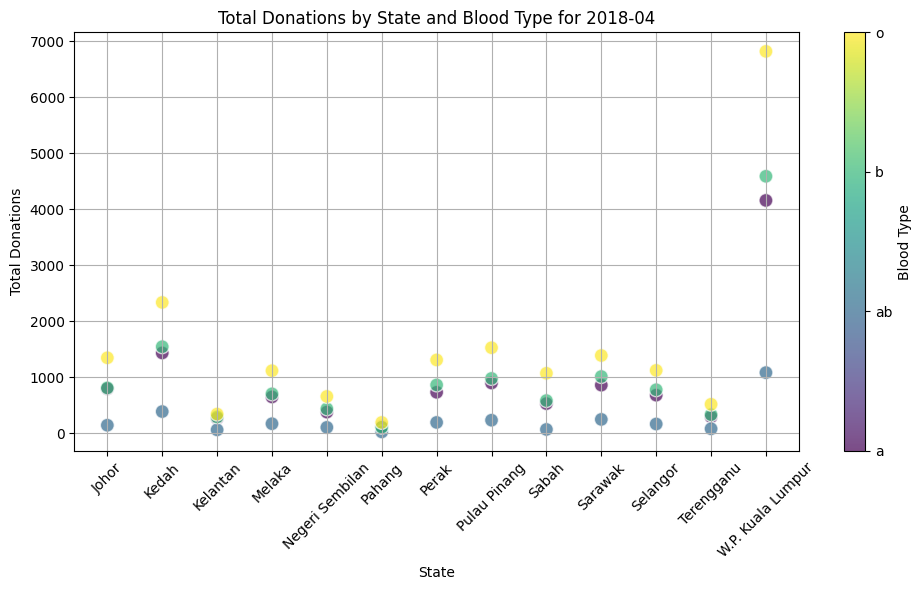

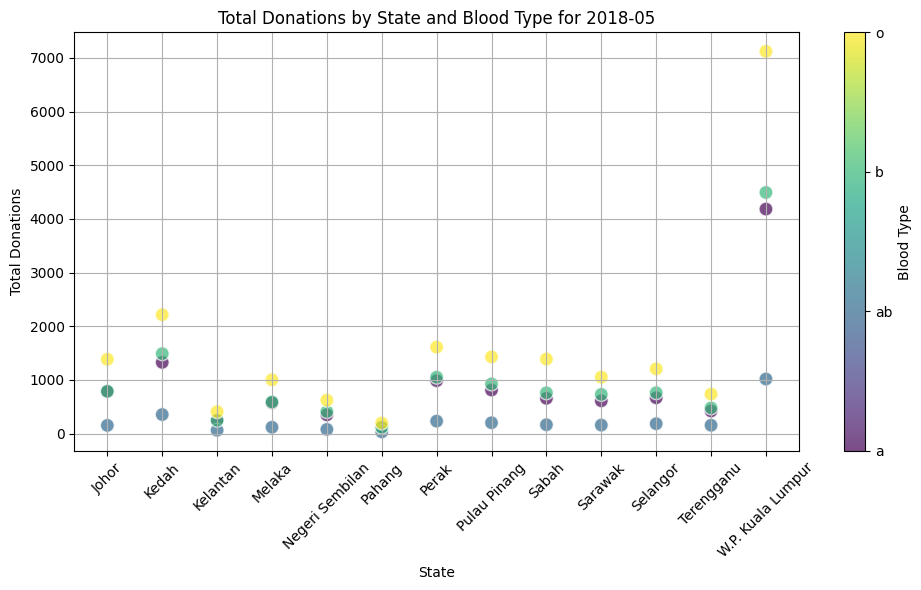

...

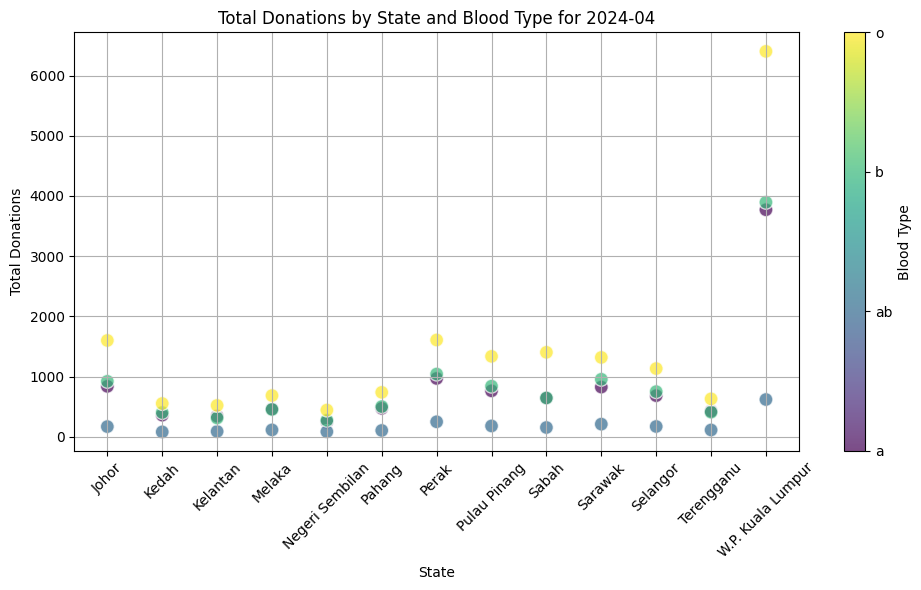

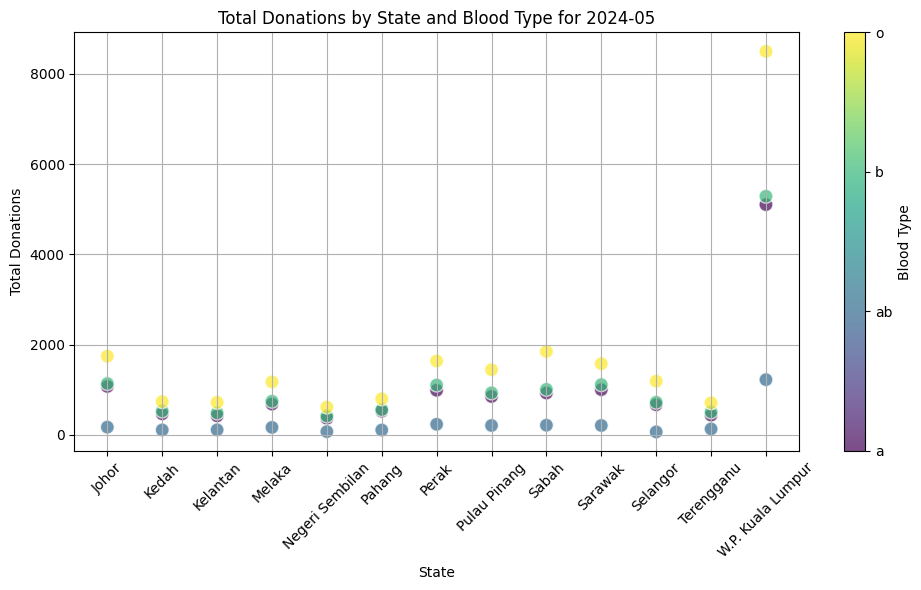

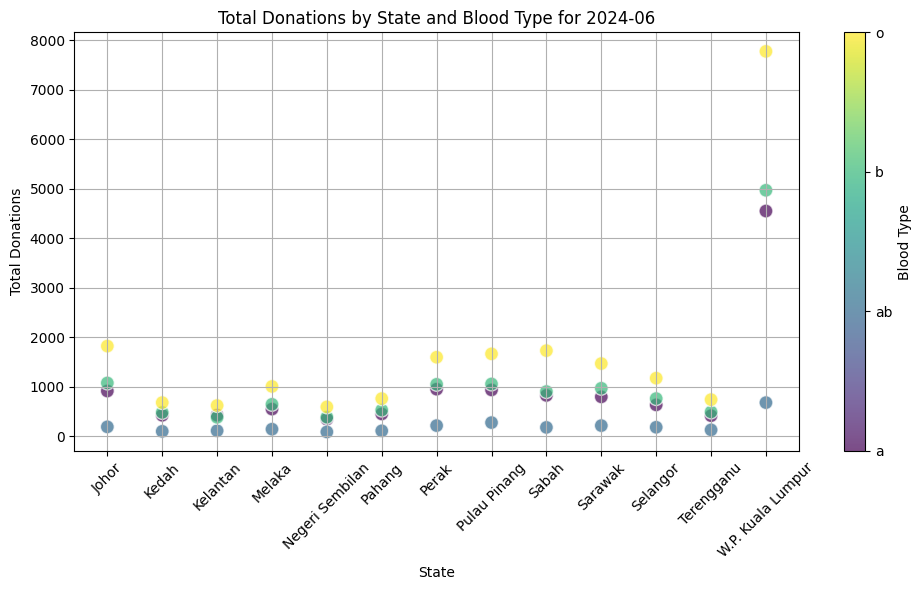

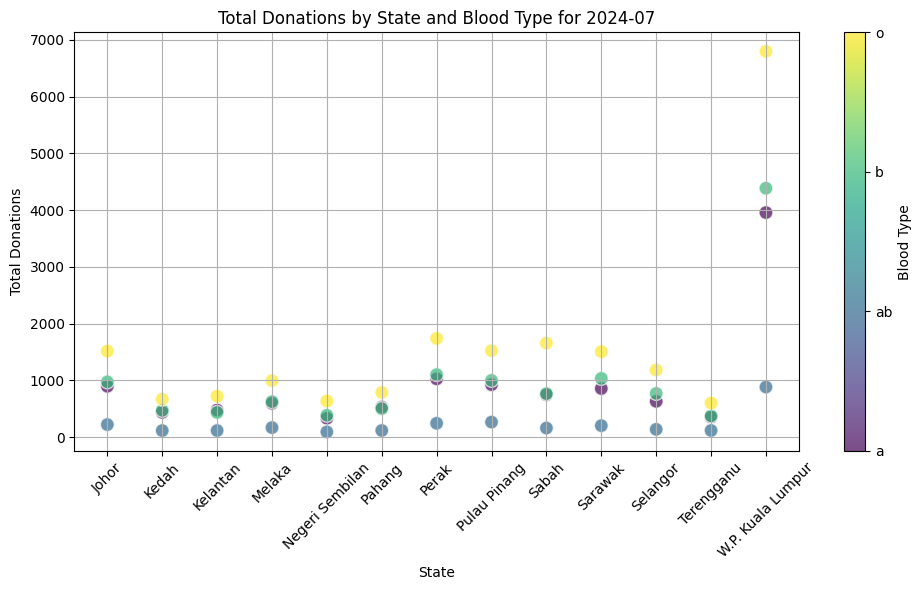

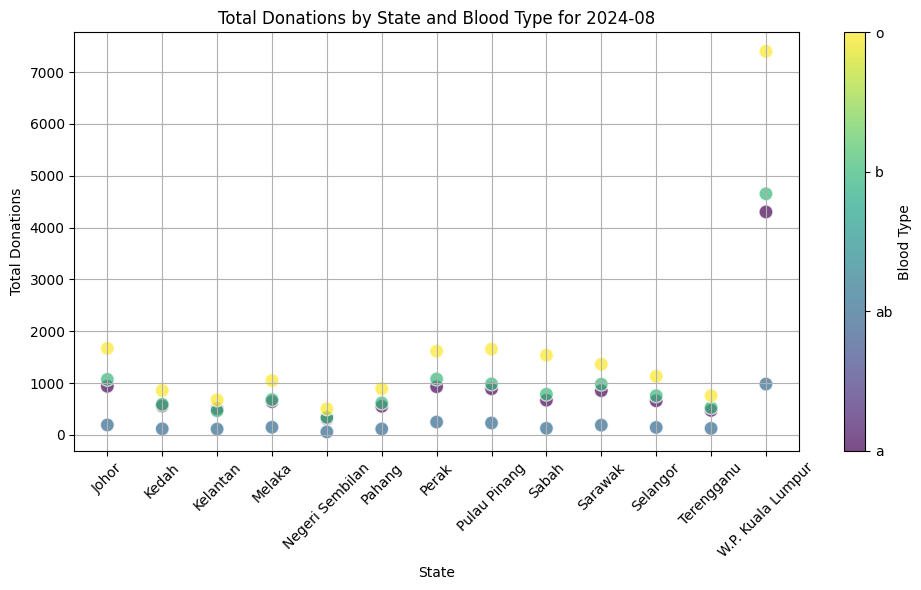

In [37]:
# Define color mapping for blood types
blood_type_mapping = {blood_type: idx for idx, blood_type in enumerate(monthly_donations['blood_type'].unique())}

# Loop through each unique year and month combination
for (year, month), month_data in monthly_donations.groupby(['year', 'month']):
    # Map blood types to color indices
    month_data['color'] = month_data['blood_type'].map(blood_type_mapping)
    
    # Create scatter plot
    plt.figure(figsize=(10, 6))
    scatter = plt.scatter(
        month_data['state'],
        month_data['donations'],
        c=month_data['color'],
        cmap='viridis',  # Use a colormap
        alpha=0.7,
        edgecolors='w',
        s=100,
        marker='o'
    )
    
    # Add colorbar with blood type names
    cbar = plt.colorbar(scatter, orientation='vertical')
    cbar.set_label('Blood Type')
    cbar.set_ticks(list(blood_type_mapping.values()))  # Set ticks to match blood type indices
    cbar.set_ticklabels(list(blood_type_mapping.keys()))  # Set tick labels to blood type names
    
    # Set labels and title
    plt.xlabel('State')
    plt.ylabel('Total Donations')
    
    title = 'Total Donations by State and Blood Type for ' + str(year) + '-' + str(month).zfill(2)
    plt.title(title)
    
    plt.xticks(rotation=45)
    plt.grid(True)
    
    # Display plot
    plt.tight_layout()
    plt.show()


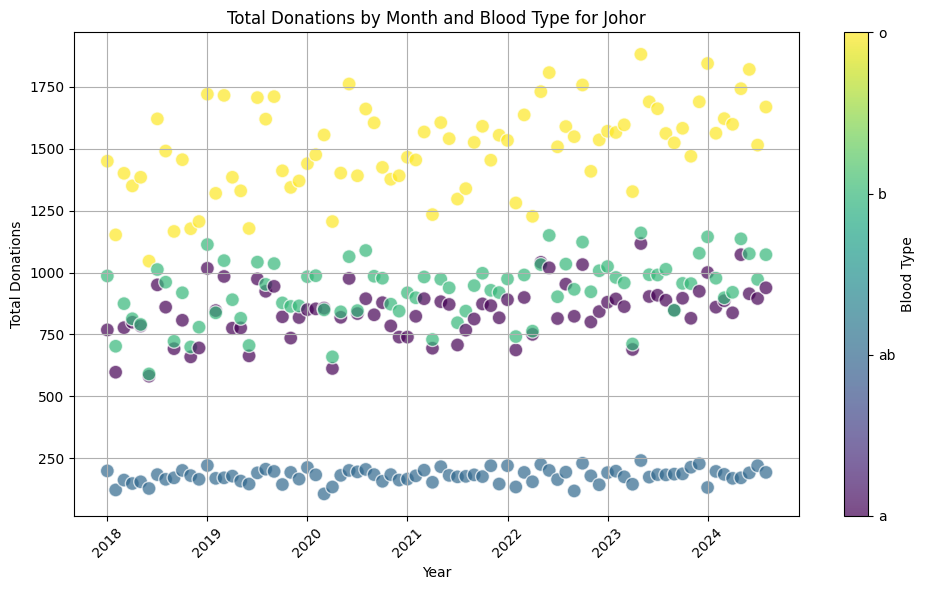

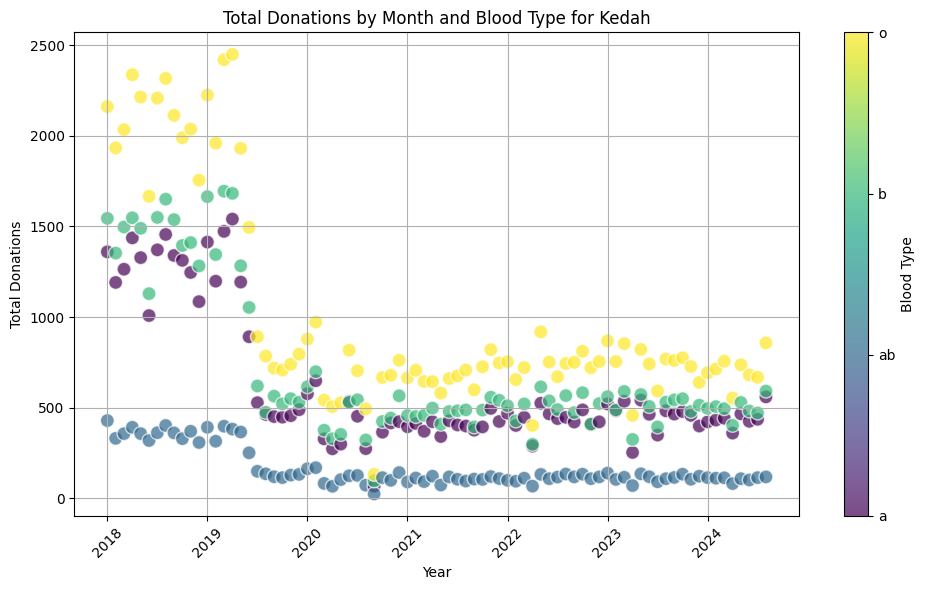

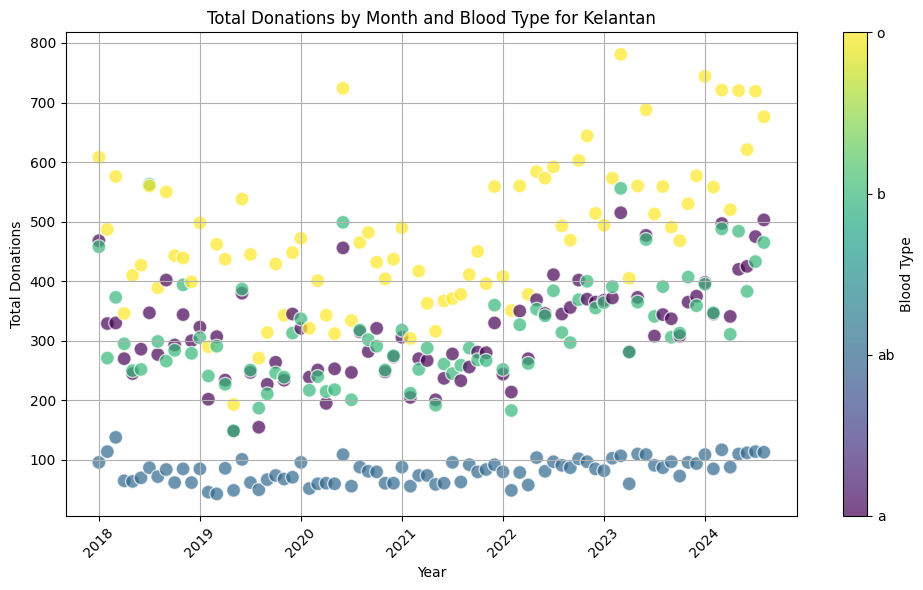

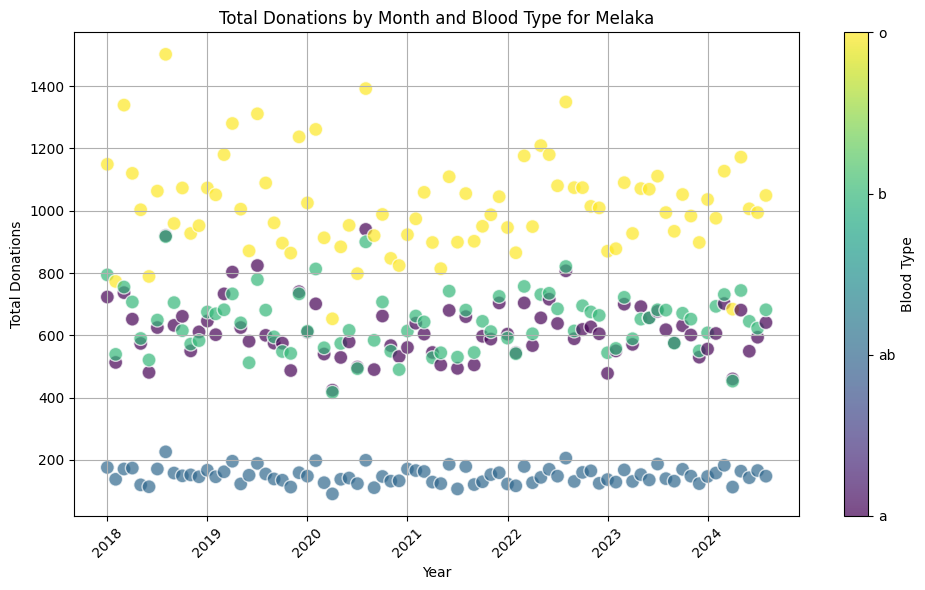

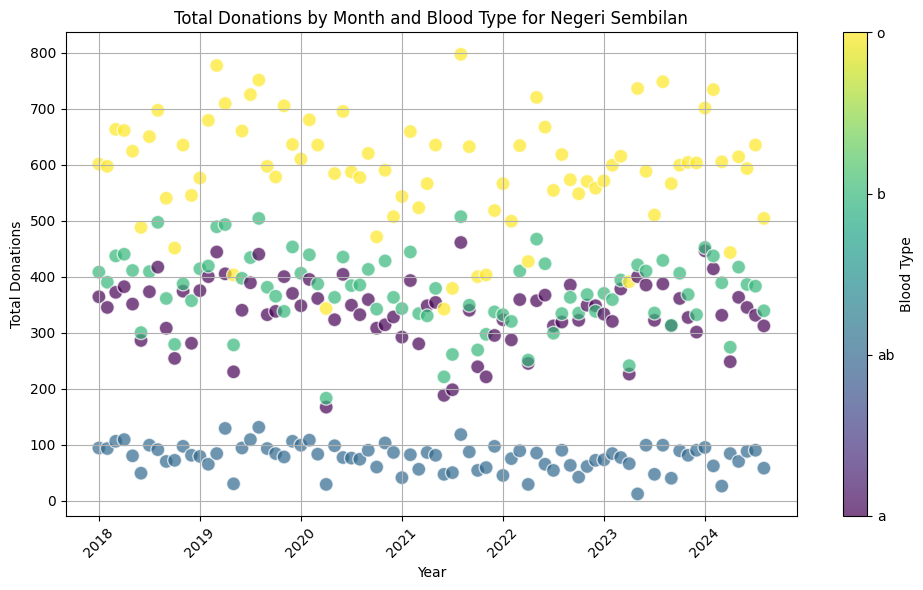

...

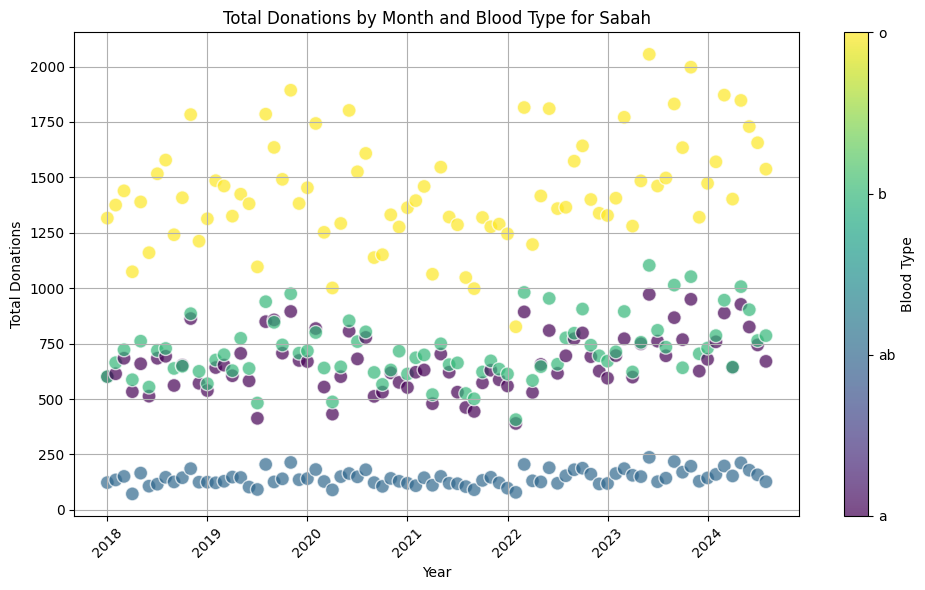

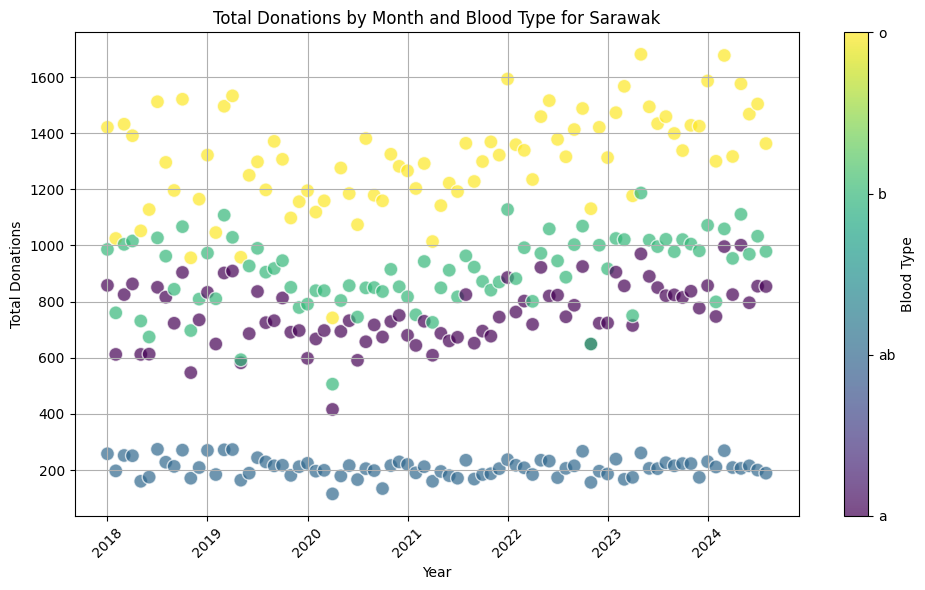

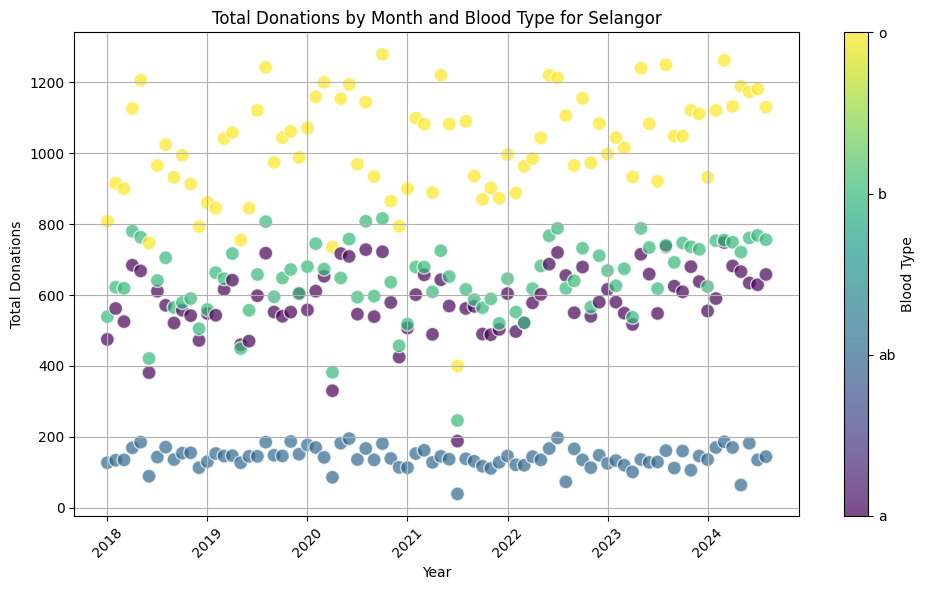

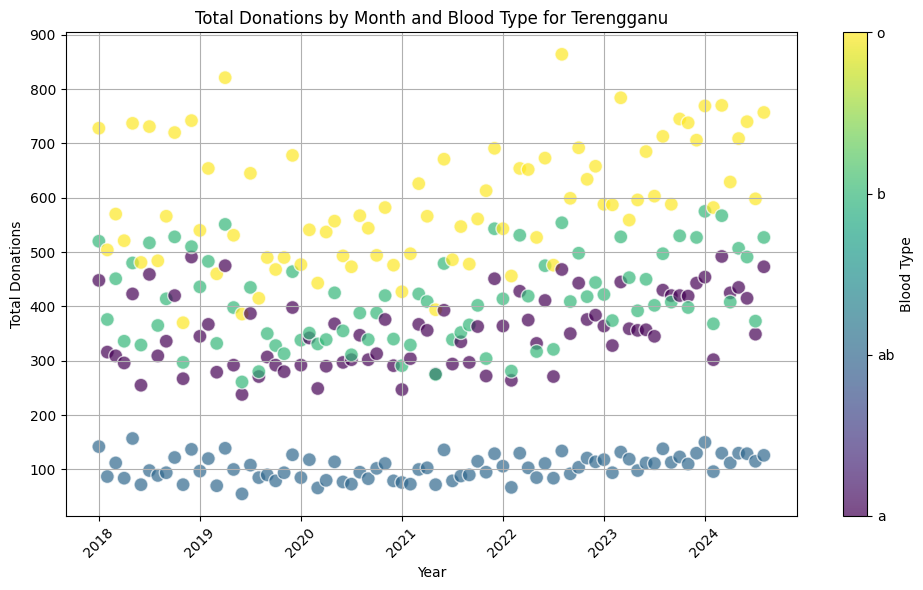

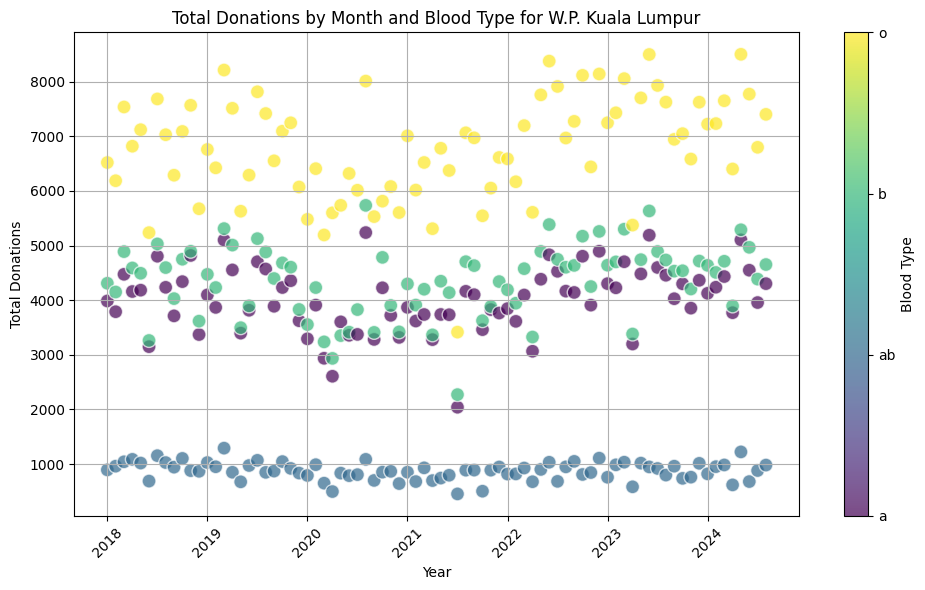

In [38]:
# Group by 'year', 'month', 'state', and 'blood_type' and sum donations
monthly_donations = monthly_donations.groupby(['year', 'month', 'state', 'blood_type']).agg({
    'donations': 'sum'
}).reset_index()

# Define color mapping for blood types
blood_type_mapping = {blood_type: idx for idx, blood_type in enumerate(monthly_donations['blood_type'].unique())}

# Convert 'year' and 'month' to a single "time" column for plotting purposes
monthly_donations['year-month'] = monthly_donations['year'].astype(str) + '-' + monthly_donations['month'].astype(str).str.zfill(2)

# Loop through each unique state
for state, state_data in monthly_donations.groupby('state'):
    # Map blood types to color indices
    state_data['color'] = state_data['blood_type'].map(blood_type_mapping)

    # Create scatter plot
    plt.figure(figsize=(10, 6))
    scatter = plt.scatter(
        state_data['year-month'],
        state_data['donations'],
        c=state_data['color'],
        cmap='viridis',  # Use a colormap
        alpha=0.7,
        edgecolors='w',
        s=100,
        marker='o'
    )

    # Add colorbar with blood type names
    cbar = plt.colorbar(scatter, orientation='vertical')
    cbar.set_label('Blood Type')
    cbar.set_ticks(list(blood_type_mapping.values()))  # Set ticks to match blood type indices
    cbar.set_ticklabels(list(blood_type_mapping.keys()))  # Set tick labels to blood type names

    # Set labels and title
    plt.xlabel('Year')
    plt.ylabel('Total Donations')
    plt.title('Total Donations by Month and Blood Type for ' + state)
    
    # Set x-ticks to show only years
    years = state_data['year'].unique()
    year_ticks = [str(year) + '-01' for year in years]  # Use the first month of each year as the tick position
    plt.xticks(ticks=year_ticks, labels=years, rotation=45)  # Only show the year as the label

    plt.grid(True)

    # Display plot
    plt.tight_layout()
    plt.show()

<h3>5. FEATURE ENGINEERING</h3>

<h4>5.1 Feature Selection</h4>

In [39]:
monthly_donations

,year,month,state,blood_type,donations,year-month
0,2018,1,Johor,a,768,2018-01
1,2018,1,Johor,ab,198,2018-01
2,2018,1,Johor,b,986,2018-01
3,2018,1,Johor,o,1450,2018-01
4,2018,1,Kedah,a,1360,2018-01
...,...,...,...,...,...,...
4155,2024,8,Terengganu,o,757,2024-08
4156,2024,8,W.P. Kuala Lumpur,a,4302,2024-08
4157,2024,8,W.P. Kuala Lumpur,ab,981,2024-08
4158,2024,8,W.P. Kuala Lumpur,b,4652,2024-08


In [40]:
df = monthly_donations.copy()
df

,year,month,state,blood_type,donations,year-month
0,2018,1,Johor,a,768,2018-01
1,2018,1,Johor,ab,198,2018-01
2,2018,1,Johor,b,986,2018-01
3,2018,1,Johor,o,1450,2018-01
4,2018,1,Kedah,a,1360,2018-01
...,...,...,...,...,...,...
4155,2024,8,Terengganu,o,757,2024-08
4156,2024,8,W.P. Kuala Lumpur,a,4302,2024-08
4157,2024,8,W.P. Kuala Lumpur,ab,981,2024-08
4158,2024,8,W.P. Kuala Lumpur,b,4652,2024-08


In [41]:
df.isnull().sum()

year          0
month         0
state         0
blood_type    0
donations     0
year-month    0
dtype: int64

***Datasets Merging***

In [42]:
population = pd.read_csv('population_state.csv')
population.head(10)

,state,date,sex,age,ethnicity,population
0,Johor,1970-01-01,both,overall,overall,1325.6
1,Johor,1970-01-01,both,0-4,overall,210.1
2,Johor,1970-01-01,both,5-9,overall,215.7
3,Johor,1970-01-01,both,10-14,overall,192.2
4,Johor,1970-01-01,both,15-19,overall,152.8
5,Johor,1970-01-01,both,20-24,overall,110.7
6,Johor,1970-01-01,both,25-29,overall,76.9
7,Johor,1970-01-01,both,30-34,overall,76.8
8,Johor,1970-01-01,both,35-39,overall,59.2
9,Johor,1970-01-01,both,40-44,overall,51.7


In [43]:
# Remove all rows from years 1970 until 2017
population['date'] = pd.to_datetime(population['date'])
population = population[population['date'].dt.year >= 2018]

In [44]:
# Extract month and year into new columns, then sum the population by month and year
population['year'] = population['date'].dt.year
population['month'] = population['date'].dt.month

In [45]:
# Drop the 'date' column after extracting year and month
population = population.drop(columns=['date'])

In [46]:
# Display the cleaned data
population.reset_index(drop=True, inplace=True)
population

,state,sex,age,ethnicity,population,year,month
0,Johor,both,overall,overall,3749.4,2018,1
1,Johor,both,overall,bumi_malay,1971.3,2018,1
2,Johor,both,overall,bumi_other,64.5,2018,1
3,Johor,both,overall,chinese,1098.6,2018,1
4,Johor,both,overall,indian,239.1,2018,1
...,...,...,...,...,...,...,...
44683,W.P. Putrajaya,male,85+,bumi_other,0.0,2024,1
44684,W.P. Putrajaya,male,85+,chinese,0.0,2024,1
44685,W.P. Putrajaya,male,85+,indian,0.0,2024,1
44686,W.P. Putrajaya,male,85+,other_citizen,0.0,2024,1


In [47]:
# Group by state, year, and month, then sum up the population
population_state = population.groupby(['state', 'year', 'month'], as_index=False)['population'].sum()

In [48]:
# Dropping the 'month' column permanently from the population_state DataFrame
population_state = population_state.drop(columns=['month'])
population_state

,state,year,population
0,Johor,2018,29993.9
1,Johor,2019,30090.8
2,Johor,2020,32076.9
3,Johor,2021,32160.0
4,Johor,2022,32225.6
...,...,...,...
107,W.P. Putrajaya,2020,871.4
108,W.P. Putrajaya,2021,920.6
109,W.P. Putrajaya,2022,934.9
110,W.P. Putrajaya,2023,948.1


In [49]:
holiday = pd.read_csv('holiday_calendar.csv')
holiday

,Country,Country Code,Day,Date,Holiday Name,Type,state
0,malaysia,MY,Saturday,2022-01-01,New Year's Day,Regional Holiday,All
1,malaysia,MY,Friday,2022-01-14,Birthday of the Sultan of Negeri Sembilan,Regional Holiday,Negeri Sembilan
2,malaysia,MY,Tuesday,2022-01-18,Thaipusam,Regional Holiday,All
3,malaysia,MY,Tuesday,2022-02-01,Chinese New Year,National Holiday,All
4,malaysia,MY,Tuesday,2022-02-01,Federal Territory Day,Regional Holiday,W.P. Kuala Lumpur
5,malaysia,MY,Wednesday,2022-02-02,Chinese New Year Holiday,National Holiday,All
6,malaysia,MY,Friday,2022-03-04,Anniversary of Installation of the Sultan,Regional Holiday,Terengganu
7,malaysia,MY,Wednesday,2022-03-23,Birthday of the Sultan of Johor,Regional Holiday,Johor
8,malaysia,MY,Friday,2022-04-15,Declaration of Malacca as a Historical City,Regional Holiday,Melaka
9,malaysia,MY,Friday,2022-04-15,Good Friday,Regional Holiday,"Sabah,Sarawak"


In [50]:
# Replace all null values in the 'State' column with 'All''
holiday['state'] = holiday['state'].fillna('All')

In [51]:
# Define the replacement string with all the state names
all_states = "W.P. Kuala Lumpur,Selangor,Pulau Pinang,Johor,Perak,Sabah,Kelantan,Pahang,Negeri Sembilan,Melaka,Terengganu,Kedah,Sarawak"


In [52]:
# Replace "All" in the 'State' column with the list of all states
holiday['state'] = holiday['state'].replace('All', all_states)

In [53]:
# Extract the month and year and create new columns
holiday['Date'] = pd.to_datetime(holiday['Date'])  # Convert 'Date' column to datetime
holiday['month'] = holiday['Date'].dt.month       # Extract month
holiday['year'] = holiday['Date'].dt.year         # Extract year

In [54]:
# Drop the 'Date' column after extraction
holiday.drop('Date', axis=1, inplace=True)

In [55]:
# Drop 'Country', 'Country Code', 'Day' columns
holiday.drop(['Country', 'Country Code', 'Day', 'Holiday Name', 'Type'], axis=1, inplace=True)

In [56]:
# Separate the state values by comma and put them in different rows (1 row per state)
holiday = holiday.assign(state=holiday['state'].str.split(',')).explode('state')

In [57]:
# Reset the index after the operations
holiday.reset_index(drop=True, inplace=True)

In [58]:
# Group by state, month, and year, and count the number of holidays
holiday_counts = holiday.groupby(['state', 'month']).size().reset_index(name='holiday_count')


In [59]:
# Display the cleaned dataset
holiday

,state,month,year
0,W.P. Kuala Lumpur,1,2022
1,Selangor,1,2022
2,Pulau Pinang,1,2022
3,Johor,1,2022
4,Perak,1,2022
...,...,...,...
176,Negeri Sembilan,12,2022
177,Melaka,12,2022
178,Terengganu,12,2022
179,Kedah,12,2022


In [60]:
df

,year,month,state,blood_type,donations,year-month
0,2018,1,Johor,a,768,2018-01
1,2018,1,Johor,ab,198,2018-01
2,2018,1,Johor,b,986,2018-01
3,2018,1,Johor,o,1450,2018-01
4,2018,1,Kedah,a,1360,2018-01
...,...,...,...,...,...,...
4155,2024,8,Terengganu,o,757,2024-08
4156,2024,8,W.P. Kuala Lumpur,a,4302,2024-08
4157,2024,8,W.P. Kuala Lumpur,ab,981,2024-08
4158,2024,8,W.P. Kuala Lumpur,b,4652,2024-08


In [61]:
# Creating a new dataframe without columns cluster, cluster_scaled, cluster_minmax
new_df = df.drop(columns=['year-month'])

In [62]:
new_df

,year,month,state,blood_type,donations
0,2018,1,Johor,a,768
1,2018,1,Johor,ab,198
2,2018,1,Johor,b,986
3,2018,1,Johor,o,1450
4,2018,1,Kedah,a,1360
...,...,...,...,...,...
4155,2024,8,Terengganu,o,757
4156,2024,8,W.P. Kuala Lumpur,a,4302
4157,2024,8,W.P. Kuala Lumpur,ab,981
4158,2024,8,W.P. Kuala Lumpur,b,4652


In [63]:
# Merge the holiday count data into new_df
new_df = pd.merge(new_df, holiday_counts, on=['state', 'month'], how='left')

In [64]:
# Fill any missing holiday counts with 0 (in case there are months without holidays)
new_df['holiday_count'] = new_df['holiday_count'].fillna(0)

In [65]:
new_df

,year,month,state,blood_type,donations,holiday_count
0,2018,1,Johor,a,768,2.0
1,2018,1,Johor,ab,198,2.0
2,2018,1,Johor,b,986,2.0
3,2018,1,Johor,o,1450,2.0
4,2018,1,Kedah,a,1360,2.0
...,...,...,...,...,...,...
4155,2024,8,Terengganu,o,757,1.0
4156,2024,8,W.P. Kuala Lumpur,a,4302,1.0
4157,2024,8,W.P. Kuala Lumpur,ab,981,1.0
4158,2024,8,W.P. Kuala Lumpur,b,4652,1.0


In [66]:
# Now, merge the result with the population_state dataframe based on year, month, and state
merged_df = pd.merge(new_df, population_state, on=['year', 'state'], how='left')

In [67]:
# Display the merged data frame
merged_df

,year,month,state,blood_type,donations,holiday_count,population
0,2018,1,Johor,a,768,2.0,29993.9
1,2018,1,Johor,ab,198,2.0,29993.9
2,2018,1,Johor,b,986,2.0,29993.9
3,2018,1,Johor,o,1450,2.0,29993.9
4,2018,1,Kedah,a,1360,2.0,17302.9
...,...,...,...,...,...,...,...
4155,2024,8,Terengganu,o,757,1.0,9856.6
4156,2024,8,W.P. Kuala Lumpur,a,4302,1.0,16539.8
4157,2024,8,W.P. Kuala Lumpur,ab,981,1.0,16539.8
4158,2024,8,W.P. Kuala Lumpur,b,4652,1.0,16539.8


In [68]:
# Drop rows where population is NaN
merged_df_cleaned = merged_df.dropna(subset=['population'])

In [69]:
# Display the cleaned dataframe
merged_df_cleaned.tail(60)

,year,month,state,blood_type,donations,holiday_count,population
4100,2024,7,Terengganu,a,349,1.0,9856.6
4101,2024,7,Terengganu,ab,115,1.0,9856.6
4102,2024,7,Terengganu,b,373,1.0,9856.6
4103,2024,7,Terengganu,o,598,1.0,9856.6
4104,2024,7,W.P. Kuala Lumpur,a,3956,1.0,16539.8
4105,2024,7,W.P. Kuala Lumpur,ab,881,1.0,16539.8
4106,2024,7,W.P. Kuala Lumpur,b,4385,1.0,16539.8
4107,2024,7,W.P. Kuala Lumpur,o,6798,1.0,16539.8
4108,2024,8,Johor,a,938,1.0,33490.4
4109,2024,8,Johor,ab,192,1.0,33490.4


<h4>5.2 Data Transformation</h4>

In [70]:
# Make a copy of the cleaned dataframe
df_ml = merged_df_cleaned.copy()

In [71]:
# Label encode non-numerical columns
le = LabelEncoder()

In [72]:
# Encode 'state' and 'blood_type' (or any other non-numeric column if needed)
df_ml['state_encoded'] = le.fit_transform(df_ml['state'])
df_ml['blood_type_encoded'] = le.fit_transform(df_ml['blood_type'])

In [73]:
# Drop the original non-numerical columns and keep only the numerical and encoded columns
df_ml = df_ml.drop(columns=['state', 'blood_type'])

In [74]:
df_ml

,year,month,donations,holiday_count,population,state_encoded,blood_type_encoded
0,2018,1,768,2.0,29993.9,0,0
1,2018,1,198,2.0,29993.9,0,1
2,2018,1,986,2.0,29993.9,0,2
3,2018,1,1450,2.0,29993.9,0,3
4,2018,1,1360,2.0,17302.9,1,0
...,...,...,...,...,...,...,...
4155,2024,8,757,1.0,9856.6,11,3
4156,2024,8,4302,1.0,16539.8,12,0
4157,2024,8,981,1.0,16539.8,12,1
4158,2024,8,4652,1.0,16539.8,12,2


In [75]:
# Calculate the total donations for all blood types within each state and month
df_ml['total_donations_all_blood'] = df_ml.groupby(['state_encoded', 'month', 'year'])['donations'].transform('sum')

# Calculate the ratio of donations for each blood type
df_ml['donation_ratio'] = df_ml['donations'] / df_ml['total_donations_all_blood']


In [76]:
# Generate a complete set of state, month, and year combinations
years = np.arange(2018, 2025)  # 2018 to 2024
months = np.arange(1, 13)      # Months 1 to 12
states = df_ml['state_encoded'].unique()

In [77]:
# Create a MultiIndex with all combinations of state, month, and year
state_month_year_combinations = pd.MultiIndex.from_product([states, months, years], names=['state_encoded', 'month', 'year'])

In [78]:
# Create DataFrame with all combinations
complete_df = pd.DataFrame(index=state_month_year_combinations).reset_index()

In [79]:
# Pivot the data so that each row is a state/month/year combination and each blood type is a column
df_pivot = df_ml.pivot_table(index=['state_encoded', 'month', 'year'], 
                             columns='blood_type_encoded', 
                             values='donation_ratio').reset_index()

In [80]:
# Ensure the column names are consistent with what is expected
df_pivot.columns = ['state_encoded', 'month', 'year', 'donation_a_ratio', 'donation_ab_ratio', 'donation_b_ratio', 'donation_o_ratio']

In [81]:
# Merge the complete set of state/month/year combinations with the pivot table
df_complete_pivot = pd.merge(complete_df, df_pivot, on=['state_encoded', 'month', 'year'], how='left')

In [82]:
# Rename the columns for clarity
df_complete_pivot.columns = ['state_encoded', 'month', 'year', 'donation_a_ratio', 'donation_ab_ratio', 'donation_b_ratio', 'donation_o_ratio']


In [83]:
# Ensure that 'holiday_count' and 'population' are unique for each state, month, and year
# Group by state, month, and year and get the first instance of holiday_count and population
df_holiday_population_unique = df_ml.groupby(['state_encoded', 'month', 'year'], as_index=False).agg({'holiday_count': 'first', 'population': 'first'})


In [84]:
# Merge the unique 'holiday_count' and 'population' into df_complete_pivot
df_complete_pivot = pd.merge(df_complete_pivot, df_holiday_population_unique, on=['state_encoded', 'month', 'year'], how='left')

In [85]:
# Display the updated DataFrame with the new columns
df_complete_pivot

,state_encoded,month,year,donation_a_ratio,donation_ab_ratio,donation_b_ratio,donation_o_ratio,holiday_count,population
0,0,1,2018,0.225750,0.058201,0.289830,0.426220,2.0,29993.9
1,0,1,2019,0.249816,0.054041,0.273397,0.422746,2.0,30090.8
2,0,1,2020,0.243902,0.060832,0.282066,0.413199,2.0,32076.9
3,0,1,2021,0.224757,0.050182,0.279197,0.445864,2.0,32160.0
4,0,1,2022,0.246060,0.060547,0.269284,0.424108,2.0,32225.6
...,...,...,...,...,...,...,...,...,...
1087,12,12,2020,0.255585,0.049453,0.263365,0.431598,2.0,15856.3
1088,12,12,2021,0.240327,0.060401,0.277104,0.422168,2.0,15711.8
1089,12,12,2022,0.252307,0.057110,0.271017,0.419566,2.0,15690.5
1090,12,12,2023,0.246317,0.057177,0.266185,0.430321,2.0,16046.2


In [86]:
df_complete_pivot.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1092 entries, 0 to 1091
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   state_encoded      1092 non-null   int32  
 1   month              1092 non-null   int32  
 2   year               1092 non-null   int32  
 3   donation_a_ratio   1040 non-null   float64
 4   donation_ab_ratio  1040 non-null   float64
 5   donation_b_ratio   1040 non-null   float64
 6   donation_o_ratio   1040 non-null   float64
 7   holiday_count      1040 non-null   float64
 8   population         1040 non-null   float64
dtypes: float64(6), int32(3)
memory usage: 64.1 KB


In [87]:
# Define a function to find the highest ratio and map it to the corresponding blood type
def find_highest_ratio(row):
    blood_type_ratios = {
        0: row['donation_a_ratio'],
        1: row['donation_ab_ratio'],
        2: row['donation_b_ratio'],
        3: row['donation_o_ratio']
    }
    # Get the key (blood type) with the lowest ratio value
    return max(blood_type_ratios, key=blood_type_ratios.get)

In [88]:
# Apply the function to each row and create a new column 'demand_blood_type_encoded'
df_complete_pivot['demand_blood_type_encoded'] = df_complete_pivot.apply(find_highest_ratio, axis=1)

In [89]:
df_complete_pivot

,state_encoded,month,year,donation_a_ratio,donation_ab_ratio,donation_b_ratio,donation_o_ratio,holiday_count,population,demand_blood_type_encoded
0,0,1,2018,0.225750,0.058201,0.289830,0.426220,2.0,29993.9,3
1,0,1,2019,0.249816,0.054041,0.273397,0.422746,2.0,30090.8,3
2,0,1,2020,0.243902,0.060832,0.282066,0.413199,2.0,32076.9,3
3,0,1,2021,0.224757,0.050182,0.279197,0.445864,2.0,32160.0,3
4,0,1,2022,0.246060,0.060547,0.269284,0.424108,2.0,32225.6,3
...,...,...,...,...,...,...,...,...,...,...
1087,12,12,2020,0.255585,0.049453,0.263365,0.431598,2.0,15856.3,3
1088,12,12,2021,0.240327,0.060401,0.277104,0.422168,2.0,15711.8,3
1089,12,12,2022,0.252307,0.057110,0.271017,0.419566,2.0,15690.5,3
1090,12,12,2023,0.246317,0.057177,0.266185,0.430321,2.0,16046.2,3


In [90]:
# Drop rows where year is 2024
df_complete_pivot = df_complete_pivot[df_complete_pivot['year'] != 2024]

In [91]:
# Display the cleaned DataFrame
df_complete_pivot.reset_index(drop=True)

,state_encoded,month,year,donation_a_ratio,donation_ab_ratio,donation_b_ratio,donation_o_ratio,holiday_count,population,demand_blood_type_encoded
0,0,1,2018,0.225750,0.058201,0.289830,0.426220,2.0,29993.9,3
1,0,1,2019,0.249816,0.054041,0.273397,0.422746,2.0,30090.8,3
2,0,1,2020,0.243902,0.060832,0.282066,0.413199,2.0,32076.9,3
3,0,1,2021,0.224757,0.050182,0.279197,0.445864,2.0,32160.0,3
4,0,1,2022,0.246060,0.060547,0.269284,0.424108,2.0,32225.6,3
...,...,...,...,...,...,...,...,...,...,...
931,12,12,2019,0.252316,0.058152,0.266732,0.422801,2.0,14260.2,3
932,12,12,2020,0.255585,0.049453,0.263365,0.431598,2.0,15856.3,3
933,12,12,2021,0.240327,0.060401,0.277104,0.422168,2.0,15711.8,3
934,12,12,2022,0.252307,0.057110,0.271017,0.419566,2.0,15690.5,3


<h4>5.3 Data Cleaning</h4>

In [92]:
# Calculate IQR and identify outliers
columns_to_check = ['donation_a_ratio', 'donation_ab_ratio', 'donation_b_ratio', 'donation_o_ratio', 'population']

for column in columns_to_check:
    Q1 = df_complete_pivot[column].quantile(0.25)
    Q3 = df_complete_pivot[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df_complete_pivot[(df_complete_pivot[column] < lower_bound) | (df_complete_pivot[column] > upper_bound)]
    print("Outliers in " + column + " (using IQR method):")
    print(outliers[[column]])
    print("\n")


Outliers in donation_a_ratio (using IQR method):
     donation_a_ratio
142          0.209524
168          0.287117
173          0.281346
177          0.288299
193          0.278926
198          0.300119
212          0.294749
213          0.280808
224          0.308756
228          0.294458
233          0.285587
245          0.288462
246          0.293118
471          0.280950
673          0.211395
675          0.208459
691          0.213024
715          0.198272
717          0.204388
730          0.213957
751          0.213279
758          0.212963
807          0.212484
938          0.214286
997          0.211838


Outliers in donation_ab_ratio (using IQR method):
     donation_ab_ratio
16            0.031194
60            0.034201
175           0.094921
182           0.097389
190           0.087398
197           0.090909
213           0.096970
227           0.087870
339           0.033634
340           0.035545
361           0.030462
365           0.031881
369           0.007648
397  

In [93]:
def cap_outliers(df, column):
    # Calculate Q1, Q3, and IQR
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    
    # Define lower and upper boundaries
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Cap the outliers
    df.loc[df[column] < lower_bound, column] = lower_bound
    df.loc[df[column] > upper_bound, column] = upper_bound

    return df

# Apply capping to specified columns
for column in columns_to_check:
    df_complete_pivot = cap_outliers(df_complete_pivot, column)

print("Data after capping outliers:")
df_complete_pivot

Data after capping outliers:


,state_encoded,month,year,donation_a_ratio,donation_ab_ratio,donation_b_ratio,donation_o_ratio,holiday_count,population,demand_blood_type_encoded
0,0,1,2018,0.225750,0.058201,0.289830,0.426220,2.0,29993.9,3
1,0,1,2019,0.249816,0.054041,0.273397,0.422746,2.0,30090.8,3
2,0,1,2020,0.243902,0.060832,0.282066,0.413199,2.0,32076.9,3
3,0,1,2021,0.224757,0.050182,0.279197,0.445864,2.0,32160.0,3
4,0,1,2022,0.246060,0.060547,0.269284,0.424108,2.0,32225.6,3
...,...,...,...,...,...,...,...,...,...,...
1086,12,12,2019,0.252316,0.058152,0.266732,0.422801,2.0,14260.2,3
1087,12,12,2020,0.255585,0.049453,0.263365,0.431598,2.0,15856.3,3
1088,12,12,2021,0.240327,0.060401,0.277104,0.422168,2.0,15711.8,3
1089,12,12,2022,0.252307,0.057110,0.271017,0.419566,2.0,15690.5,3


<h2>6. MACHINE LEARNING</h2>

<H4>6.1 Model Training</H4>

In [94]:
# Features (independent variables)
X = df_complete_pivot[['state_encoded', 'month', 'holiday_count', 'population']]
X

,state_encoded,month,holiday_count,population
0,0,1,2.0,29993.9
1,0,1,2.0,30090.8
2,0,1,2.0,32076.9
3,0,1,2.0,32160.0
4,0,1,2.0,32225.6
...,...,...,...,...
1086,12,12,2.0,14260.2
1087,12,12,2.0,15856.3
1088,12,12,2.0,15711.8
1089,12,12,2.0,15690.5


#### CONCEPT 1: 4 same models produce 1 blood type ratio from each model (thinking of using ratio instead of number of donation at first)

In [95]:
# Targets (dependent variables - donation ratios for each blood type)
y_a = df_complete_pivot['donation_a_ratio']
y_ab = df_complete_pivot['donation_ab_ratio']
y_b = df_complete_pivot['donation_b_ratio']
y_o = df_complete_pivot['donation_o_ratio']

In [96]:
# Split data into training and testing sets for each target variable
X_train_a, X_test_a, y_train_a, y_test_a = train_test_split(X, y_a, test_size=0.2, random_state=42)
X_train_ab, X_test_ab, y_train_ab, y_test_ab = train_test_split(X, y_ab, test_size=0.2, random_state=42)
X_train_b, X_test_b, y_train_b, y_test_b = train_test_split(X, y_b, test_size=0.2, random_state=42)
X_train_o, X_test_o, y_train_o, y_test_o = train_test_split(X, y_o, test_size=0.2, random_state=42)

In [97]:
# Define models
models = {
    'Linear Regression': LinearRegression(),
    'Decision Tree Regressor': DecisionTreeRegressor(random_state=42),
    'Random Forest Regressor': RandomForestRegressor(random_state=42),
    'Support Vector Regressor': SVR(),
    'Gradient Boosting Regressor': GradientBoostingRegressor(random_state=42)
}

In [98]:
# Function to train, predict, and evaluate models
def train_evaluate_model(X_train, X_test, y_train, y_test, model_name, model):
    # Train the model
    model.fit(X_train, y_train)
    
    # Make predictions
    y_pred = model.predict(X_test)
    
    # Calculate evaluation metrics
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    # Print evaluation results
    print("Results for " + model_name + ":")
    print("Mean Absolute Error: " + str(mae))
    print("Mean Squared Error: " + str(mse))
    print("R^2 Score: " + str(r2))
    print("=" * 50)


In [99]:
# Train and evaluate models for each donation ratio (A, AB, B, O)
for model_name, model in models.items():
    print("Evaluating model for donation A ratio using " + model_name)
    train_evaluate_model(X_train_a, X_test_a, y_train_a, y_test_a, model_name, model)
    
    print("Evaluating model for donation AB ratio using " + model_name)
    train_evaluate_model(X_train_ab, X_test_ab, y_train_ab, y_test_ab, model_name, model)
    
    print("Evaluating model for donation B ratio using " + model_name)
    train_evaluate_model(X_train_b, X_test_b, y_train_b, y_test_b, model_name, model)
    
    print("Evaluating model for donation O ratio using " + model_name)
    train_evaluate_model(X_train_o, X_test_o, y_train_o, y_test_o, model_name, model)


Evaluating model for donation A ratio using Linear Regression
Results for Linear Regression:
Mean Absolute Error: 0.010064970599682942
Mean Squared Error: 0.00016619518851991645
R^2 Score: 0.07922507051328365
Evaluating model for donation AB ratio using Linear Regression
Results for Linear Regression:
Mean Absolute Error: 0.006467552981665136
Mean Squared Error: 6.688614079969049e-05
R^2 Score: 0.05644116420885048
Evaluating model for donation B ratio using Linear Regression
Results for Linear Regression:
Mean Absolute Error: 0.01163117453511043
Mean Squared Error: 0.00023025842425859858
R^2 Score: 0.05538963760205995
Evaluating model for donation O ratio using Linear Regression
Results for Linear Regression:
Mean Absolute Error: 0.01444034462181751
Mean Squared Error: 0.0003417856339215326
R^2 Score: 0.13985955256303284
Evaluating model for donation A ratio using Decision Tree Regressor
Results for Decision Tree Regressor:
Mean Absolute Error: 0.012065742242805797
Mean Squared Error: 

In [100]:
   model_a = GradientBoostingRegressor(random_state=42)
   model_a.fit(X_train_a, y_train_a)  
   
   model_ab = GradientBoostingRegressor(random_state=42)
   model_ab.fit(X_train_ab, y_train_ab)
   
   model_b = GradientBoostingRegressor(random_state=42)
   model_b.fit(X_train_b, y_train_b)
   
   model_o = GradientBoostingRegressor(random_state=42)
   model_o.fit(X_train_o, y_train_o)
   

GradientBoostingRegressor(random_state=42)

In [101]:
# Define the parameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 4, 5]
}

# GridSearch for donation A ratio model
model_a = GradientBoostingRegressor(random_state=42)
grid_search_a = GridSearchCV(estimator=model_a, param_grid=param_grid, cv=5, scoring='r2', n_jobs=-1)
grid_search_a.fit(X_train_a, y_train_a)

# Best model and parameters for donation A ratio
best_model_a = grid_search_a.best_estimator_
print("Best parameters for donation A ratio:", grid_search_a.best_params_)

# GridSearch for donation AB ratio model
model_ab = GradientBoostingRegressor(random_state=42)
grid_search_ab = GridSearchCV(estimator=model_ab, param_grid=param_grid, cv=5, scoring='r2', n_jobs=-1)
grid_search_ab.fit(X_train_ab, y_train_ab)

# Best model and parameters for donation AB ratio
best_model_ab = grid_search_ab.best_estimator_
print("Best parameters for donation AB ratio:", grid_search_ab.best_params_)

# GridSearch for donation B ratio model
model_b = GradientBoostingRegressor(random_state=42)
grid_search_b = GridSearchCV(estimator=model_b, param_grid=param_grid, cv=5, scoring='r2', n_jobs=-1)
grid_search_b.fit(X_train_b, y_train_b)

# Best model and parameters for donation B ratio
best_model_b = grid_search_b.best_estimator_
print("Best parameters for donation B ratio:", grid_search_b.best_params_)

# GridSearch for donation O ratio model
model_o = GradientBoostingRegressor(random_state=42)
grid_search_o = GridSearchCV(estimator=model_o, param_grid=param_grid, cv=5, scoring='r2', n_jobs=-1)
grid_search_o.fit(X_train_o, y_train_o)

# Best model and parameters for donation O ratio
best_model_o = grid_search_o.best_estimator_
print("Best parameters for donation O ratio:", grid_search_o.best_params_)


Best parameters for donation A ratio: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 300}
Best parameters for donation AB ratio: {'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 100}
Best parameters for donation B ratio: {'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 100}
Best parameters for donation O ratio: {'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 100}


In [102]:
# Create the models with the best hyperparameters from GridSearchCV
gbc_models = {
    'Gradient Boosting (A)': GradientBoostingRegressor(learning_rate=0.01, max_depth=3, n_estimators=300, random_state=42),
    'Gradient Boosting (AB)': GradientBoostingRegressor(learning_rate=0.05, max_depth=3, n_estimators=100, random_state=42),
    'Gradient Boosting (B)': GradientBoostingRegressor(learning_rate=0.01, max_depth=3, n_estimators=300, random_state=42),
    'Gradient Boosting (O)': GradientBoostingRegressor(learning_rate=0.01, max_depth=4, n_estimators=300, random_state=42)
}


In [103]:
# Function to train, predict, and evaluate models
def train_evaluate_model(X_train, X_test, y_train, y_test, model_name, model):
    # Train the model
    model.fit(X_train, y_train)
    
    # Make predictions
    y_pred = model.predict(X_test)
    
    # Calculate evaluation metrics
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    # Print evaluation results
    print("Results for " + model_name + ":")
    print("Mean Absolute Error: " + str(mae))
    print("Mean Squared Error: " + str(mse))
    print("R^2 Score: " + str(r2))
    
    # Perform cross-validation
    cv_scores = cross_val_score(model, X_train, y_train, cv=5, scoring='r2')
    print("Cross-Validation R^2 Scores:", cv_scores)
    print("="*50)

# Evaluate each model for the associated dataset
model_datasets = {
    'Gradient Boosting (A)': (X_train_a, X_test_a, y_train_a, y_test_a),
    'Gradient Boosting (AB)': (X_train_ab, X_test_ab, y_train_ab, y_test_ab),
    'Gradient Boosting (B)': (X_train_b, X_test_b, y_train_b, y_test_b),
    'Gradient Boosting (O)': (X_train_o, X_test_o, y_train_o, y_test_o)
}

for model_name, (X_train, X_test, y_train, y_test) in model_datasets.items():
    model = gbc_models[model_name]
    print(f"Evaluating model for {model_name}")
    train_evaluate_model(X_train, X_test, y_train, y_test, model_name, model)


Evaluating model for Gradient Boosting (A)
Results for Gradient Boosting (A):
Mean Absolute Error: 0.008232461823624323
Mean Squared Error: 0.00011470227500084733
R^2 Score: 0.3645124138884773
Cross-Validation R^2 Scores: [0.36968324 0.38552756 0.44484826 0.41911922 0.33107568]
Evaluating model for Gradient Boosting (AB)
Results for Gradient Boosting (AB):
Mean Absolute Error: 0.005437197205924646
Mean Squared Error: 4.642276004757529e-05
R^2 Score: 0.3451168672463649
Cross-Validation R^2 Scores: [0.41859366 0.45403152 0.36798792 0.53589308 0.3891961 ]
Evaluating model for Gradient Boosting (B)
Results for Gradient Boosting (B):
Mean Absolute Error: 0.00865023839907783
Mean Squared Error: 0.00013240157454106355
R^2 Score: 0.45683681406231336
Cross-Validation R^2 Scores: [0.33143619 0.4553065  0.38277814 0.4676837  0.26311345]
Evaluating model for Gradient Boosting (O)
Results for Gradient Boosting (O):
Mean Absolute Error: 0.0101555902640104
Mean Squared Error: 0.00018385553842760035
R

In [104]:
# State mapping
state_mapping = {
    0: 'Johor',
    1: 'Kedah',
    2: 'Kelantan',
    3: 'Melaka',
    4: 'N. Sembilan',
    5: 'Pahang',
    6: 'Perak',
    7: 'Perlis',
    8: 'Penang',
    9: 'Sabah',
    10: 'Sarawak',
    11: 'Selangor',
    12: 'Terengganu',
    13: 'W.P. Kuala Lumpur'
}

In [105]:
# Create a DataFrame for 2025 predictions
states = df_ml['state_encoded'].unique()
months = np.arange(1, 13)  # Months 1 to 12 for 2025
state_month_combinations = pd.MultiIndex.from_product([states, months], names=['state_encoded', 'month'])
df_2025 = pd.DataFrame(index=state_month_combinations).reset_index()

In [106]:
# Get holiday_count and population from 2024
df_2024 = df_ml[df_ml['year'] == 2024][['state_encoded', 'month', 'holiday_count', 'population']]

In [107]:
# Fill holiday_count and population for each state in df_2025
for state in states:
    holiday_count_value = df_2024[(df_2024['state_encoded'] == state) & (df_2024['month'] == 1)]['holiday_count'].values[0]
    population_value = df_2024[(df_2024['state_encoded'] == state) & (df_2024['month'] == 1)]['population'].values[0]
    
    df_2025.loc[df_2025['state_encoded'] == state, 'holiday_count'] = holiday_count_value
    df_2025.loc[df_2025['state_encoded'] == state, 'population'] = population_value

In [108]:
# Ensure holiday_count and population are set correctly
df_2025['holiday_count'] = df_2025['holiday_count'].fillna(0)  # Replace any NaNs with 0 just in case

In [109]:
# Prepare the feature set for predictions
X_2025 = df_2025[['state_encoded', 'month', 'holiday_count', 'population']]

In [110]:
# Use the Gradient Boosting models to predict ratios for 2025
df_2025['donation_a_ratio'] = best_model_a.predict(X_2025)
df_2025['donation_ab_ratio'] = best_model_ab.predict(X_2025)
df_2025['donation_b_ratio'] = best_model_b.predict(X_2025)
df_2025['donation_o_ratio'] = best_model_o.predict(X_2025)

In [111]:
# Find the blood type with the highest demand for each state and month
def find_highest_demand(row):
    ratios = {
        'A': row['donation_a_ratio'],
        'AB': row['donation_ab_ratio'],
        'B': row['donation_b_ratio'],
        'O': row['donation_o_ratio']
    }
    return max(ratios, key=ratios.get)

In [112]:
df_2025['highest_demand_blood_type'] = df_2025.apply(find_highest_demand, axis=1)

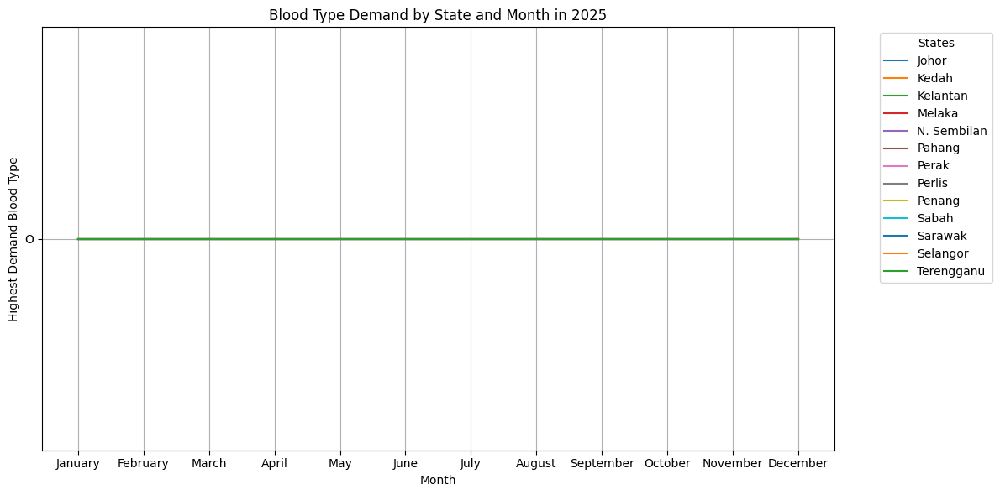

In [113]:
# Visualize the results
plt.figure(figsize=(12, 6))

# Plot each state's data
for state in states:
    state_data = df_2025[df_2025['state_encoded'] == state]
    plt.plot(state_data['month'], state_data['highest_demand_blood_type'], label=state_mapping[state])

# Set x-axis labels for months
plt.xticks(np.arange(1, 13), ['January', 'February', 'March', 'April', 'May', 'June',
                                'July', 'August', 'September', 'October', 'November', 'December'])

plt.title('Blood Type Demand by State and Month in 2025')
plt.xlabel('Month')
plt.ylabel('Highest Demand Blood Type')

# Position the legend outside the graph
plt.legend(title='States', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.grid(True)
plt.tight_layout()  
plt.show()

#### CONCEPT 2: One model produces multiple outputs, ratios for every blood type

***1. Stacked Esemble Model of MultiOut Regressor and Gradient Booting Regressor without Year as the independent variable***

In [114]:
# Define independent variables (features)
X = df_complete_pivot[['month', 'state_encoded', 'holiday_count', 'population']]  # Replace with your actual feature columns

# Define target variables (ratios)
Y = df_complete_pivot[['donation_a_ratio', 'donation_ab_ratio', 'donation_b_ratio', 'donation_o_ratio']]  # Replace with your actual target columns


In [115]:

# Assuming X is your feature matrix
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [116]:
# Split data into training and test sets
X_train, X_test, Y_train, Y_test = train_test_split(X_scaled, Y, test_size=0.2, random_state=42)


In [117]:
# Define the base regressor and multi-output regressor
base_regressor = GradientBoostingRegressor(random_state=42)
multi_output_regressor = MultiOutputRegressor(base_regressor)


In [118]:
# Define the parameter grid for GridSearchCV
param_grid = {
    'multi_output__estimator__n_estimators': [50, 100],
    'multi_output__estimator__max_depth': [3, 5],
    'multi_output__estimator__learning_rate': [0.01, 0.1, 0.2]  # Added learning_rate for a more comprehensive search
}


In [119]:
# Create the pipeline
pipeline = Pipeline([
    ('multi_output', multi_output_regressor)
])

# Setup GridSearchCV with the pipeline and parameter grid
grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=5, scoring='r2', n_jobs=-1)

# Fit GridSearchCV
grid_search.fit(X_train, Y_train)


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('multi_output',
                                        MultiOutputRegressor(estimator=GradientBoostingRegressor(random_state=42)))]),
             n_jobs=-1,
             param_grid={'multi_output__estimator__learning_rate': [0.01, 0.1,
                                                                    0.2],
                         'multi_output__estimator__max_depth': [3, 5],
                         'multi_output__estimator__n_estimators': [50, 100]},
             scoring='r2')

In [120]:
# Get the best model from the grid search
best_regressor = grid_search.best_estimator_


In [121]:
#Making Sure Every Sample of Predictions(Total ratios of 4 blood types) is equal to 1.00

In [122]:
# Make predictions on the test set
Y_pred = best_regressor.predict(X_test)

In [123]:
# Normalize predictions
Y_pred_normalized = Y_pred / Y_pred.sum(axis=1, keepdims=True)

In [124]:
# Create a DataFrame for the predictions
df_predictions = pd.DataFrame(Y_pred_normalized, columns=['donation_a_ratio', 'donation_ab_ratio', 'donation_b_ratio', 'donation_o_ratio'])

In [125]:
# Add a column for the total of the ratios
df_predictions['Total of Ratios'] = df_predictions.sum(axis=1)



In [126]:
# Add independent variables (X_test) to the predictions DataFrame for context
df_X_test = pd.DataFrame(X_test, columns=['month', 'state_encoded', 'holiday_count', 'population'])  # Use actual feature names
df_results = pd.concat([df_X_test, df_predictions], axis=1)

In [127]:
# Display the first 5 samples
df_results.head(5)

,month,state_encoded,holiday_count,population,donation_a_ratio,donation_ab_ratio,donation_b_ratio,donation_o_ratio,Total of Ratios
0,-0.144841,-0.534522,-1.306697,-1.014022,0.242247,0.055636,0.272044,0.430074,1.0
1,1.593255,-1.603567,0.945731,1.601106,0.242227,0.051785,0.270979,0.435009,1.0
2,1.303572,-1.069045,0.945731,-0.406828,0.266525,0.068606,0.267795,0.397074,1.0
3,-1.303572,0.801784,0.945731,0.143095,0.238219,0.062916,0.286021,0.412843,1.0
4,0.144841,0.801784,-0.180483,0.469280,0.240413,0.066959,0.283529,0.409098,1.0


In [128]:
# Evaluate the model for each target variable
for i, target_name in enumerate(['donation_a_ratio', 'donation_ab_ratio', 'donation_b_ratio', 'donation_o_ratio']):
    mae = mean_absolute_error(Y_test.iloc[:, i], Y_pred_normalized[:, i])
    mse = mean_squared_error(Y_test.iloc[:, i], Y_pred_normalized[:, i])
    r2 = r2_score(Y_test.iloc[:, i], Y_pred_normalized[:, i])
    
    print("Results for " + target_name + ":")
    print("Mean Absolute Error: " + str(round(mae, 4)))
    print("Mean Squared Error: " + str(round(mse, 4)))
    print("R^2 Score: " + str(round(r2, 4)))
    print("=" * 50)

Results for donation_a_ratio:
Mean Absolute Error: 0.0085
Mean Squared Error: 0.0001
R^2 Score: 0.3327
Results for donation_ab_ratio:
Mean Absolute Error: 0.0055
Mean Squared Error: 0.0
R^2 Score: 0.3419
Results for donation_b_ratio:
Mean Absolute Error: 0.0088
Mean Squared Error: 0.0001
R^2 Score: 0.4389
Results for donation_o_ratio:
Mean Absolute Error: 0.0103
Mean Squared Error: 0.0002
R^2 Score: 0.5432


***Exploring Other Models***

***2. Random Forest Regressor***

In [129]:
from sklearn.ensemble import RandomForestRegressor

# Define the base regressor as RandomForestRegressor
base_regressor_rf = RandomForestRegressor(random_state=42)
multi_output_regressor_rf = MultiOutputRegressor(base_regressor_rf)

# Define the parameter grid for RandomForestRegressor
param_grid_rf = {
    'multi_output__estimator__n_estimators': [50, 100],
    'multi_output__estimator__max_depth': [None, 10, 20]
}

# Create the pipeline
pipeline_rf = Pipeline([
    ('multi_output', multi_output_regressor_rf)
])

# Setup GridSearchCV with the pipeline and parameter grid for RandomForestRegressor
grid_search_rf = GridSearchCV(estimator=pipeline_rf, param_grid=param_grid_rf, cv=5, scoring='r2', n_jobs=-1)

# Fit GridSearchCV
grid_search_rf.fit(X_train, Y_train)

# Get the best model from the grid search
best_regressor_rf = grid_search_rf.best_estimator_

# Make predictions on the test set
Y_pred_rf = best_regressor_rf.predict(X_test)

# Normalize predictions
Y_pred_rf_normalized = Y_pred_rf / Y_pred_rf.sum(axis=1, keepdims=True)

# Evaluate the RandomForest model
print("Random Forest Model Evaluation:")
for i, target_name in enumerate(['donation_a_ratio', 'donation_ab_ratio', 'donation_b_ratio', 'donation_o_ratio']):
    mae = mean_absolute_error(Y_test.iloc[:, i], Y_pred_rf_normalized[:, i])
    mse = mean_squared_error(Y_test.iloc[:, i], Y_pred_rf_normalized[:, i])
    r2 = r2_score(Y_test.iloc[:, i], Y_pred_rf_normalized[:, i])
    
    print("Results for " + target_name + ":")
    print("Mean Absolute Error: " + str(round(mae, 4)))
    print("Mean Squared Error: " + str(round(mse, 4)))
    print("R^2 Score: " + str(round(r2, 4)))
    print("=" * 50)


Random Forest Model Evaluation:
Results for donation_a_ratio:
Mean Absolute Error: 0.0089
Mean Squared Error: 0.0001
R^2 Score: 0.2554
Results for donation_ab_ratio:
Mean Absolute Error: 0.0057
Mean Squared Error: 0.0001
R^2 Score: 0.2816
Results for donation_b_ratio:
Mean Absolute Error: 0.01
Mean Squared Error: 0.0002
R^2 Score: 0.2767
Results for donation_o_ratio:
Mean Absolute Error: 0.0117
Mean Squared Error: 0.0002
R^2 Score: 0.4184


***3. Support Vector Regression***

In [130]:
from sklearn.svm import SVR

# Define the base regressor as SVR with RBF kernel
base_regressor_svr = SVR(kernel='rbf')
multi_output_regressor_svr = MultiOutputRegressor(base_regressor_svr)

# Define the parameter grid for SVR
param_grid_svr = {
    'multi_output__estimator__C': [0.1, 1, 10],
    'multi_output__estimator__gamma': [0.01, 0.1, 1]
}

# Create the pipeline
pipeline_svr = Pipeline([
    ('multi_output', multi_output_regressor_svr)
])

# Setup GridSearchCV with the pipeline and parameter grid for SVR
grid_search_svr = GridSearchCV(estimator=pipeline_svr, param_grid=param_grid_svr, cv=5, scoring='r2', n_jobs=-1)

# Fit GridSearchCV
grid_search_svr.fit(X_train, Y_train)

# Get the best model from the grid search
best_regressor_svr = grid_search_svr.best_estimator_

# Make predictions on the test set
Y_pred_svr = best_regressor_svr.predict(X_test)

# Normalize predictions
Y_pred_svr_normalized = Y_pred_svr / Y_pred_svr.sum(axis=1, keepdims=True)

# Evaluate the SVR model
print("Support Vector Regression Model Evaluation:")
for i, target_name in enumerate(['donation_a_ratio', 'donation_ab_ratio', 'donation_b_ratio', 'donation_o_ratio']):
    mae = mean_absolute_error(Y_test.iloc[:, i], Y_pred_svr_normalized[:, i])
    mse = mean_squared_error(Y_test.iloc[:, i], Y_pred_svr_normalized[:, i])
    r2 = r2_score(Y_test.iloc[:, i], Y_pred_svr_normalized[:, i])
    
    print("Results for " + target_name + ":")
    print("Mean Absolute Error: " + str(round(mae, 4)))
    print("Mean Squared Error: " + str(round(mse, 4)))
    print("R^2 Score: " + str(round(r2, 4)))
    print("=" * 50)


Support Vector Regression Model Evaluation:
Results for donation_a_ratio:
Mean Absolute Error: 0.0105
Mean Squared Error: 0.0002
R^2 Score: -0.0424
Results for donation_ab_ratio:
Mean Absolute Error: 0.0069
Mean Squared Error: 0.0001
R^2 Score: -0.0
Results for donation_b_ratio:
Mean Absolute Error: 0.0118
Mean Squared Error: 0.0002
R^2 Score: -0.0006
Results for donation_o_ratio:
Mean Absolute Error: 0.0149
Mean Squared Error: 0.0004
R^2 Score: -0.0054


***4. Stacked Esemble Model of MultiOut Regressor and Gradient Booting Regressor, include Year as the independent variable***

In [131]:
X = df_complete_pivot[['year', 'month', 'state_encoded', 'holiday_count', 'population']]

# Select target variables
y = df_complete_pivot[['donation_a_ratio', 'donation_ab_ratio', 'donation_b_ratio', 'donation_o_ratio']]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define parameter grid for GridSearchCV
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 1.0]
}

# Initialize lists to hold the best models and parameters
best_models = []
best_params_list = []

# Perform GridSearchCV for each target variable
for col in y.columns:
    print('Tuning hyperparameters for ' + col)
    grid_search = GridSearchCV(estimator=GradientBoostingRegressor(), param_grid=param_grid, cv=3, scoring='r2', n_jobs=-1)
    grid_search.fit(X_train, y_train[col])
    best_models.append(grid_search.best_estimator_)
    best_params_list.append(grid_search.best_params_)
    print('Best hyperparameters for ' + col + ': ' + str(grid_search.best_params_))

# Create the MultiOutputRegressor with the best models
multioutput_model = MultiOutputRegressor(GradientBoostingRegressor())
multioutput_model.estimators_ = best_models

# Fit the model
multioutput_model.fit(X_train, y_train)

# Make predictions
y_pred = multioutput_model.predict(X_test)

# Evaluate the model
for i, col in enumerate(y.columns):
    mse = mean_squared_error(y_test.iloc[:, i], y_pred[:, i])
    r2 = r2_score(y_test.iloc[:, i], y_pred[:, i])
    print('\nResults for ' + col + ':')
    print('Mean Squared Error: ' + str(mse))
    print('R^2 Score: ' + str(r2))

Tuning hyperparameters for donation_a_ratio
Best hyperparameters for donation_a_ratio: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 200, 'subsample': 1.0}
Tuning hyperparameters for donation_ab_ratio
Best hyperparameters for donation_ab_ratio: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
Tuning hyperparameters for donation_b_ratio
Best hyperparameters for donation_b_ratio: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 200, 'subsample': 1.0}
Tuning hyperparameters for donation_o_ratio
Best hyperparameters for donation_o_ratio: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.8}

Results for donation_a_ratio:
Mean Squared Error: 0.00012125287118579665
R^2 Score: 0.32821999896354204

Results for donation_ab_ratio:
Mean Squared Error: 4.29867604496575e-05
R^2 Score: 0.39358831053234344

Results for donation_b_ratio:
Mean Squared Error: 0.00013740760463701727
R^2 Score: 0.43630011527120605

Results for donation

#### CONCEPT 3: Predict the exact number of donations (how many units of blood supply) using more features instead of ratio.

***-using 1 model that produces 4 outputs (multiple target variables)***

***Adding Features by merging with new datasets (including data cleaning and preprocessing)***

In [132]:
blood_donations_state = pd.read_csv('blood_donations_state.csv')
blood_donations_state

,date,state,blood_type,donations
0,2006-01-01,Johor,all,87
1,2006-01-02,Johor,all,15
2,2006-01-03,Johor,all,8
3,2006-01-04,Johor,all,33
4,2006-01-05,Johor,all,20
...,...,...,...,...
444075,2024-09-10,W.P. Kuala Lumpur,ab,25
444076,2024-09-11,W.P. Kuala Lumpur,ab,26
444077,2024-09-12,W.P. Kuala Lumpur,ab,36
444078,2024-09-13,W.P. Kuala Lumpur,ab,35


In [133]:
donations_state = pd.read_csv('donations_state.csv')
donations_state

,date,state,daily,blood_a,blood_b,blood_o,blood_ab,location_centre,location_mobile,type_wholeblood,type_apheresis_platelet,type_apheresis_plasma,type_other,social_civilian,social_student,social_policearmy,donations_new,donations_regular,donations_irregular
0,2006-01-01,Malaysia,525,152,139,194,40,308,217,525,0,0,0,496,18,11,243,277,5
1,2006-01-02,Malaysia,227,53,43,112,19,162,65,217,6,4,0,224,2,1,83,143,1
2,2006-01-03,Malaysia,112,29,21,56,6,112,0,89,10,13,0,105,2,5,8,101,3
3,2006-01-04,Malaysia,391,92,98,165,36,145,246,371,4,16,0,316,71,4,286,102,3
4,2006-01-05,Malaysia,582,149,198,193,42,371,211,548,17,17,0,555,19,8,328,250,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95671,2024-09-12,W.P. Kuala Lumpur,662,166,204,256,36,109,553,643,13,6,0,610,46,6,106,352,204
95672,2024-09-13,W.P. Kuala Lumpur,427,107,106,179,35,92,335,405,11,11,0,388,35,4,55,318,54
95673,2024-09-14,W.P. Kuala Lumpur,450,125,128,178,19,138,312,428,15,7,0,409,38,3,43,342,65
95674,2024-09-15,W.P. Kuala Lumpur,668,185,157,294,32,124,544,668,0,0,0,621,42,5,88,466,114


In [134]:
population_state = pd.read_csv('population_state.csv')
population_state

,state,date,sex,age,ethnicity,population
0,Johor,1970-01-01,both,overall,overall,1325.6
1,Johor,1970-01-01,both,0-4,overall,210.1
2,Johor,1970-01-01,both,5-9,overall,215.7
3,Johor,1970-01-01,both,10-14,overall,192.2
4,Johor,1970-01-01,both,15-19,overall,152.8
...,...,...,...,...,...,...
257290,W.P. Putrajaya,2024-01-01,male,85+,bumi_other,0.0
257291,W.P. Putrajaya,2024-01-01,male,85+,chinese,0.0
257292,W.P. Putrajaya,2024-01-01,male,85+,indian,0.0
257293,W.P. Putrajaya,2024-01-01,male,85+,other_citizen,0.0


In [135]:
# Convert the date columns to datetime format
blood_donations_state['date'] = pd.to_datetime(blood_donations_state['date'])
donations_state['date'] = pd.to_datetime(donations_state['date'])

In [136]:
# Extract year and month from the date column for both dataframes
blood_donations_state['year'] = blood_donations_state['date'].dt.year
blood_donations_state['month'] = blood_donations_state['date'].dt.month

In [137]:
donations_state['year'] = donations_state['date'].dt.year
donations_state['month'] = donations_state['date'].dt.month

In [138]:
# Drop unnecessary columns
blood_donations_state.drop(['date', 'blood_type'], axis=1, inplace=True)
donations_state.drop(['date'], axis=1, inplace=True)

In [139]:
# Group and sum the blood donations and donations data
blood_donations_grouped = blood_donations_state.groupby(['state', 'year', 'month'], as_index=False).sum()
donations_grouped = donations_state.groupby(['state', 'year', 'month'], as_index=False).sum()

In [140]:
# Merge the datasets on state, year, and month
merged_df = pd.merge(blood_donations_grouped, donations_grouped, on=['state', 'year', 'month'], how='inner')

In [141]:
# # Drop rows where any blood donation value is zero
# merged_df = merged_df[(merged_df[['blood_a', 'blood_ab', 'blood_b', 'blood_o']] != 0).all(axis=1)]

In [142]:
# Define a capping function to handle outliers
def cap_outliers(df, columns, lower_percentile=1, upper_percentile=99):
    for col in columns:
        lower_bound = df[col].quantile(lower_percentile / 100)
        upper_bound = df[col].quantile(upper_percentile / 100)
        df[col] = df[col].clip(lower=lower_bound, upper=upper_bound)
    return df

In [143]:
# Cap the outliers for the blood types
columns_to_cap = ['blood_a', 'blood_b', 'blood_o', 'blood_ab']
merged_df = cap_outliers(merged_df, columns_to_cap)

In [144]:
merged_df

,state,year,month,donations,daily,blood_a,blood_b,blood_o,blood_ab,location_centre,...,type_wholeblood,type_apheresis_platelet,type_apheresis_plasma,type_other,social_civilian,social_student,social_policearmy,donations_new,donations_regular,donations_irregular
0,Johor,2006,1,1648,824,217.00,209.00,342.00,56,824,...,820,0,4,0,761,6,57,433,354,37
1,Johor,2006,2,1828,914,231.00,244.00,382.00,57,914,...,914,0,0,0,861,7,46,514,344,56
2,Johor,2006,3,1464,732,175.00,202.00,315.00,40,732,...,732,0,0,0,717,14,1,438,249,45
3,Johor,2006,4,1902,951,242.00,255.00,404.00,50,951,...,950,0,1,0,930,16,5,474,426,51
4,Johor,2006,5,2438,1219,315.00,315.00,506.00,83,1219,...,1208,0,11,0,1179,6,34,548,610,61
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2920,W.P. Kuala Lumpur,2024,5,40228,20115,4362.08,4739.56,7269.88,1046,3650,...,19591,349,175,0,17018,2816,281,3685,12526,3904
2921,W.P. Kuala Lumpur,2024,6,35935,17969,4362.08,4739.56,7269.88,679,3846,...,17441,340,188,0,15697,1904,368,2887,11666,3416
2922,W.P. Kuala Lumpur,2024,7,32042,16022,3956.00,4385.00,6798.00,881,3317,...,15438,375,209,0,14057,1774,191,2792,10059,3171
2923,W.P. Kuala Lumpur,2024,8,34673,17337,4302.00,4652.00,7269.88,981,3681,...,16769,354,214,0,15206,1893,238,2930,10989,3418


In [145]:
# Dropping the 'donations' column and renaming 'daily' to 'monthly_donations' because we want to treat those data related to those 4 blood types only
merged_df = merged_df.drop(columns=['donations'])
merged_df = merged_df.rename(columns={'daily': 'monthly_donations'})

In [146]:
merged_df

,state,year,month,monthly_donations,blood_a,blood_b,blood_o,blood_ab,location_centre,location_mobile,type_wholeblood,type_apheresis_platelet,type_apheresis_plasma,type_other,social_civilian,social_student,social_policearmy,donations_new,donations_regular,donations_irregular
0,Johor,2006,1,824,217.00,209.00,342.00,56,824,0,820,0,4,0,761,6,57,433,354,37
1,Johor,2006,2,914,231.00,244.00,382.00,57,914,0,914,0,0,0,861,7,46,514,344,56
2,Johor,2006,3,732,175.00,202.00,315.00,40,732,0,732,0,0,0,717,14,1,438,249,45
3,Johor,2006,4,951,242.00,255.00,404.00,50,951,0,950,0,1,0,930,16,5,474,426,51
4,Johor,2006,5,1219,315.00,315.00,506.00,83,1219,0,1208,0,11,0,1179,6,34,548,610,61
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2920,W.P. Kuala Lumpur,2024,5,20115,4362.08,4739.56,7269.88,1046,3650,16465,19591,349,175,0,17018,2816,281,3685,12526,3904
2921,W.P. Kuala Lumpur,2024,6,17969,4362.08,4739.56,7269.88,679,3846,14123,17441,340,188,0,15697,1904,368,2887,11666,3416
2922,W.P. Kuala Lumpur,2024,7,16022,3956.00,4385.00,6798.00,881,3317,12705,15438,375,209,0,14057,1774,191,2792,10059,3171
2923,W.P. Kuala Lumpur,2024,8,17337,4302.00,4652.00,7269.88,981,3681,13656,16769,354,214,0,15206,1893,238,2930,10989,3418


In [147]:
# Dropping the 'sex', 'age', and 'ethnicity' columns
population_state_df = population_state.drop(columns=['sex', 'age', 'ethnicity'])

In [148]:
# Converting the 'date' column to datetime to extract month and year
population_state['date'] = pd.to_datetime(population_state['date'])
population_state['year'] = population_state['date'].dt.year
population_state['month'] = population_state['date'].dt.month

In [149]:
# Summing up population by state, year, and month
population_state_grouped = population_state.groupby(['state', 'year', 'month'])['population'].sum().reset_index()

In [150]:
# Merging the population data with the merged_df on 'state', 'year', and 'month'
merged_df = pd.merge(merged_df, population_state_grouped, on=['state', 'year', 'month'], how='left')

In [151]:
merged_df

,state,year,month,monthly_donations,blood_a,blood_b,blood_o,blood_ab,location_centre,location_mobile,...,type_apheresis_platelet,type_apheresis_plasma,type_other,social_civilian,social_student,social_policearmy,donations_new,donations_regular,donations_irregular,population
0,Johor,2006,1,824,217.00,209.00,342.00,56,824,0,...,0,4,0,761,6,57,433,354,37,25074.6
1,Johor,2006,2,914,231.00,244.00,382.00,57,914,0,...,0,0,0,861,7,46,514,344,56,NaN
2,Johor,2006,3,732,175.00,202.00,315.00,40,732,0,...,0,0,0,717,14,1,438,249,45,NaN
3,Johor,2006,4,951,242.00,255.00,404.00,50,951,0,...,0,1,0,930,16,5,474,426,51,NaN
4,Johor,2006,5,1219,315.00,315.00,506.00,83,1219,0,...,0,11,0,1179,6,34,548,610,61,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2920,W.P. Kuala Lumpur,2024,5,20115,4362.08,4739.56,7269.88,1046,3650,16465,...,349,175,0,17018,2816,281,3685,12526,3904,NaN
2921,W.P. Kuala Lumpur,2024,6,17969,4362.08,4739.56,7269.88,679,3846,14123,...,340,188,0,15697,1904,368,2887,11666,3416,NaN
2922,W.P. Kuala Lumpur,2024,7,16022,3956.00,4385.00,6798.00,881,3317,12705,...,375,209,0,14057,1774,191,2792,10059,3171,NaN
2923,W.P. Kuala Lumpur,2024,8,17337,4302.00,4652.00,7269.88,981,3681,13656,...,354,214,0,15206,1893,238,2930,10989,3418,NaN


In [152]:
merged_df.columns

Index(['state', 'year', 'month', 'monthly_donations', 'blood_a', 'blood_b',
       'blood_o', 'blood_ab', 'location_centre', 'location_mobile',
       'type_wholeblood', 'type_apheresis_platelet', 'type_apheresis_plasma',
       'type_other', 'social_civilian', 'social_student', 'social_policearmy',
       'donations_new', 'donations_regular', 'donations_irregular',
       'population'],
      dtype='object')

In [153]:
# Find the final year that has 0 monthly donations for any state
final_zero_donations_year = merged_df[merged_df['monthly_donations'] == 0]['year'].max()

final_zero_donations_year

2017

In [154]:
# Drop all rows where the year is between 2006 and 2017 (inclusive)
merged_df_cleaned = merged_df[(merged_df['year'] < 2006) | (merged_df['year'] > 2017)]

In [155]:
# Drop rows where year is 2024
merged_df_cleaned = merged_df_cleaned[merged_df_cleaned['year'] != 2024]

In [156]:
# Drop specified columns
columns_to_drop = ['type_wholeblood', 'type_apheresis_platelet', 'type_apheresis_plasma', 'type_other']

In [157]:
merged_df = merged_df_cleaned.drop(columns=columns_to_drop)

In [158]:
merged_df

,state,year,month,monthly_donations,blood_a,blood_b,blood_o,blood_ab,location_centre,location_mobile,social_civilian,social_student,social_policearmy,donations_new,donations_regular,donations_irregular,population
144,Johor,2018,1,3402,768.00,986.0,1450.00,198,3402,0,3263,126,13,1163,1612,627,29993.9
145,Johor,2018,2,2572,597.00,702.0,1152.00,121,2572,0,2416,146,10,933,1184,455,NaN
146,Johor,2018,3,3213,777.00,874.0,1401.00,161,3213,0,3084,97,32,931,1677,605,NaN
147,Johor,2018,4,3109,799.00,813.0,1350.00,147,3109,0,2961,101,47,968,1619,522,NaN
148,Johor,2018,5,3113,784.00,790.0,1385.00,154,3113,0,2998,110,5,903,1644,566,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2911,W.P. Kuala Lumpur,2023,8,17615,4362.08,4735.0,7269.88,798,3585,14030,15036,2318,261,3512,10767,3336,NaN
2912,W.P. Kuala Lumpur,2023,9,16466,4026.00,4531.0,6944.00,961,3911,12555,14431,1868,167,2853,10490,3123,NaN
2913,W.P. Kuala Lumpur,2023,10,16623,4299.00,4538.0,7048.00,738,3534,13089,14331,2146,146,3162,10104,3357,NaN
2914,W.P. Kuala Lumpur,2023,11,15401,3854.00,4204.0,6583.00,760,3236,12165,12922,2210,269,2912,9701,2788,NaN


In [159]:
null_values = merged_df.isnull().sum()

# Print the columns with null values and their counts
print(null_values[null_values > 0])

population    858
dtype: int64


In [160]:
# Filter rows where 'population' column has null values
null_population_rows = merged_df[merged_df['population'].isnull()]

# Select and display the 'year', 'month', and 'state' columns
null_population_display = null_population_rows[['year', 'month', 'state']]

# Print the result
print(null_population_display)


      year  month              state
145   2018      2              Johor
146   2018      3              Johor
147   2018      4              Johor
148   2018      5              Johor
149   2018      6              Johor
...    ...    ...                ...
2911  2023      8  W.P. Kuala Lumpur
2912  2023      9  W.P. Kuala Lumpur
2913  2023     10  W.P. Kuala Lumpur
2914  2023     11  W.P. Kuala Lumpur
2915  2023     12  W.P. Kuala Lumpur

[858 rows x 3 columns]


In [161]:
# Fill null values in the population column
merged_df['population'] = merged_df.groupby(['year', 'state'])['population'].transform(lambda x: x.ffill().bfill())

In [162]:
null_values = merged_df.isnull().sum()

# Print the columns with null values and their counts
print(null_values[null_values > 0])

Series([], dtype: int64)


In [163]:
merged_df

,state,year,month,monthly_donations,blood_a,blood_b,blood_o,blood_ab,location_centre,location_mobile,social_civilian,social_student,social_policearmy,donations_new,donations_regular,donations_irregular,population
144,Johor,2018,1,3402,768.00,986.0,1450.00,198,3402,0,3263,126,13,1163,1612,627,29993.9
145,Johor,2018,2,2572,597.00,702.0,1152.00,121,2572,0,2416,146,10,933,1184,455,29993.9
146,Johor,2018,3,3213,777.00,874.0,1401.00,161,3213,0,3084,97,32,931,1677,605,29993.9
147,Johor,2018,4,3109,799.00,813.0,1350.00,147,3109,0,2961,101,47,968,1619,522,29993.9
148,Johor,2018,5,3113,784.00,790.0,1385.00,154,3113,0,2998,110,5,903,1644,566,29993.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2911,W.P. Kuala Lumpur,2023,8,17615,4362.08,4735.0,7269.88,798,3585,14030,15036,2318,261,3512,10767,3336,16046.2
2912,W.P. Kuala Lumpur,2023,9,16466,4026.00,4531.0,6944.00,961,3911,12555,14431,1868,167,2853,10490,3123,16046.2
2913,W.P. Kuala Lumpur,2023,10,16623,4299.00,4538.0,7048.00,738,3534,13089,14331,2146,146,3162,10104,3357,16046.2
2914,W.P. Kuala Lumpur,2023,11,15401,3854.00,4204.0,6583.00,760,3236,12165,12922,2210,269,2912,9701,2788,16046.2


In [164]:
# Assuming merged_df is your DataFrame
label_encoder = LabelEncoder()
merged_df['encoded_state'] = label_encoder.fit_transform(merged_df['state'])

In [165]:
# This method also encodes unique states
merged_df['encoded_state'] = pd.factorize(merged_df['state'])[0]

In [166]:
merged_df.reset_index(drop=True, inplace=True)

In [167]:
merged_df

,state,year,month,monthly_donations,blood_a,blood_b,blood_o,blood_ab,location_centre,location_mobile,social_civilian,social_student,social_policearmy,donations_new,donations_regular,donations_irregular,population,encoded_state
0,Johor,2018,1,3402,768.00,986.0,1450.00,198,3402,0,3263,126,13,1163,1612,627,29993.9,0
1,Johor,2018,2,2572,597.00,702.0,1152.00,121,2572,0,2416,146,10,933,1184,455,29993.9,0
2,Johor,2018,3,3213,777.00,874.0,1401.00,161,3213,0,3084,97,32,931,1677,605,29993.9,0
3,Johor,2018,4,3109,799.00,813.0,1350.00,147,3109,0,2961,101,47,968,1619,522,29993.9,0
4,Johor,2018,5,3113,784.00,790.0,1385.00,154,3113,0,2998,110,5,903,1644,566,29993.9,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
931,W.P. Kuala Lumpur,2023,8,17615,4362.08,4735.0,7269.88,798,3585,14030,15036,2318,261,3512,10767,3336,16046.2,12
932,W.P. Kuala Lumpur,2023,9,16466,4026.00,4531.0,6944.00,961,3911,12555,14431,1868,167,2853,10490,3123,16046.2,12
933,W.P. Kuala Lumpur,2023,10,16623,4299.00,4538.0,7048.00,738,3534,13089,14331,2146,146,3162,10104,3357,16046.2,12
934,W.P. Kuala Lumpur,2023,11,15401,3854.00,4204.0,6583.00,760,3236,12165,12922,2210,269,2912,9701,2788,16046.2,12


In [168]:
# Extract unique state and encoded_state combinations
unique_states = merged_df[['state', 'encoded_state']].drop_duplicates()

# Display the result
unique_states


,state,encoded_state
0,Johor,0
72,Kedah,1
144,Kelantan,2
216,Melaka,3
288,Negeri Sembilan,4
360,Pahang,5
432,Perak,6
504,Pulau Pinang,7
576,Sabah,8
648,Sarawak,9


In [169]:
# Ensemble a few models with Multi Out Regressor 

In [170]:
# Define the target variables 
target_columns = ['blood_a', 'blood_ab', 'blood_b', 'blood_o']

# Define independent variables
feature_columns = ['year', 'month','encoded_state','population', 'location_centre', 'location_mobile',
                   'social_civilian', 'social_student', 'social_policearmy', 
                   'donations_new', 'donations_regular', 'donations_irregular']


# Separate features (X) and target variables (y)
X = merged_df[feature_columns]
y = merged_df[target_columns]

In [171]:

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



In [172]:
# Define models and their hyperparameter grids
model_grids = {
    'Linear Regression': (LinearRegression(), {}),
    'Random Forest Regressor': (RandomForestRegressor(random_state=42), {
        'estimator__n_estimators': [50, 100],
        'estimator__max_depth': [5, 10]
    }),
    'Support Vector Regressor': (SVR(), {
        'estimator__C': [0.1, 1, 10],
        'estimator__gamma': ['scale', 'auto']
    }),
    'Gradient Boosting Regressor': (GradientBoostingRegressor(random_state=42), {
        'estimator__n_estimators': [50, 100],
        'estimator__learning_rate': [0.01, 0.1, 0.2],
        'estimator__max_depth': [3, 5]
    }),
    'Decision Tree Regressor': (DecisionTreeRegressor(random_state=42), {
        'estimator__max_depth': [3, 5, 10]
    })
}




In [173]:
# Dictionary to store performance results
results = {}

# Hyperparameter tuning and evaluation
for name, (model, param_grid) in model_grids.items():
    multi_output_model = MultiOutputRegressor(model)
    
    # Setup GridSearchCV for hyperparameter tuning
    grid_search = GridSearchCV(multi_output_model, param_grid, cv=5, scoring='r2', n_jobs=-1)
    
    # Fit GridSearchCV
    grid_search.fit(X_train, y_train)
    
    # Get the best model
    best_model = grid_search.best_estimator_
    
    # Make predictions
    y_pred = best_model.predict(X_test)
    
    # Calculate evaluation metrics
    r2 = r2_score(y_test, y_pred)
    rmse = mean_squared_error(y_test, y_pred, squared=False)
    mae = mean_absolute_error(y_test, y_pred)
    
    # Store results
    results[name] = {
        'Best Hyperparameters': grid_search.best_params_,
        'R-squared': r2,
        'RMSE': rmse,
        'MAE': mae
    }

# Convert results to a DataFrame for better display
results_df = pd.DataFrame(results).T


C:\Program Files\Python312\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Program Files\Python312\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Program Files\Python312\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Program Files\Python312\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, 

In [174]:
# Display the results
print("Model Performance Results:")
print(results_df)

Model Performance Results:
                                                          Best Hyperparameters  \
Linear Regression                                                           {}   
Random Forest Regressor      {'estimator__max_depth': 10, 'estimator__n_est...   
Support Vector Regressor     {'estimator__C': 10, 'estimator__gamma': 'scale'}   
Gradient Boosting Regressor  {'estimator__learning_rate': 0.1, 'estimator__...   
Decision Tree Regressor                            {'estimator__max_depth': 5}   

                            R-squared        RMSE         MAE  
Linear Regression            0.987416   87.077044   43.574695  
Random Forest Regressor      0.992455   64.843515    34.29547  
Support Vector Regressor     0.374028  880.744736  399.472641  
Gradient Boosting Regressor  0.992078   66.775179   37.035838  
Decision Tree Regressor      0.985472   90.265549   58.525407  


<h4>6.2 Model Selection</h4>

***An ensemble of MultiOut Regressor and GradientBoostingRegressor is chosen***

In [175]:
model = MultiOutputRegressor(GradientBoostingRegressor(random_state=42))
model.fit(X_train, y_train)


MultiOutputRegressor(estimator=GradientBoostingRegressor(random_state=42))

***Revisit Feature Importance for Blood B(because of the suspicious output for future prediction in 6.2)***

In [176]:
# Access the RandomForestRegressor from the MultiOutputRegressor
rf_model = model.estimators_[2]  # Access the model for 'blood_b' predictions (index 2)

# Get feature importance for Blood B
importances = rf_model.feature_importances_

# List feature importance with their names
feature_names = X_train.columns  # Assuming your X_train is a DataFrame with column names
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
feature_importance_df.sort_values(by='Importance', ascending=False, inplace=True)

# Display feature importance
print(feature_importance_df)


                Feature  Importance
6       social_civilian    0.351166
11  donations_irregular    0.268856
2         encoded_state    0.174411
5       location_mobile    0.129493
10    donations_regular    0.058928
9         donations_new    0.009861
7        social_student    0.006208
4       location_centre    0.000686
8     social_policearmy    0.000225
3            population    0.000120
1                 month    0.000042
0                  year    0.000003


In [177]:
correlation = merged_df[['blood_b', 'encoded_state', 'location_mobile', 'social_civilian']].corr()
print(correlation)


                  blood_b  encoded_state  location_mobile  social_civilian
blood_b          1.000000       0.441019         0.941109         0.992219
encoded_state    0.441019       1.000000         0.448468         0.438420
location_mobile  0.941109       0.448468         1.000000         0.925147
social_civilian  0.992219       0.438420         0.925147         1.000000


***Evaluate Model Performance for Each Blood Type***

In [178]:
# Assuming you have split validation/test data
y_pred = model.predict(X_test)  # Predictions on validation data
y_pred_df = pd.DataFrame(y_pred, columns=['blood_a', 'blood_ab', 'blood_b', 'blood_o'])

for blood_type in ['blood_a', 'blood_ab', 'blood_b', 'blood_o']:
    mse = mean_squared_error(y_test[blood_type], y_pred_df[blood_type])
    r2 = r2_score(y_test[blood_type], y_pred_df[blood_type])
    print(blood_type + " - MSE: " + str(mse) + ", R²: " + str(r2))


blood_a - MSE: 3829.721593841102, R²: 0.9964097169842335
blood_ab - MSE: 920.8611554446821, R²: 0.9821606984967983
blood_b - MSE: 5708.600478519854, R²: 0.9954314651804359
blood_o - MSE: 7850.929516499516, R²: 0.9972671922259927


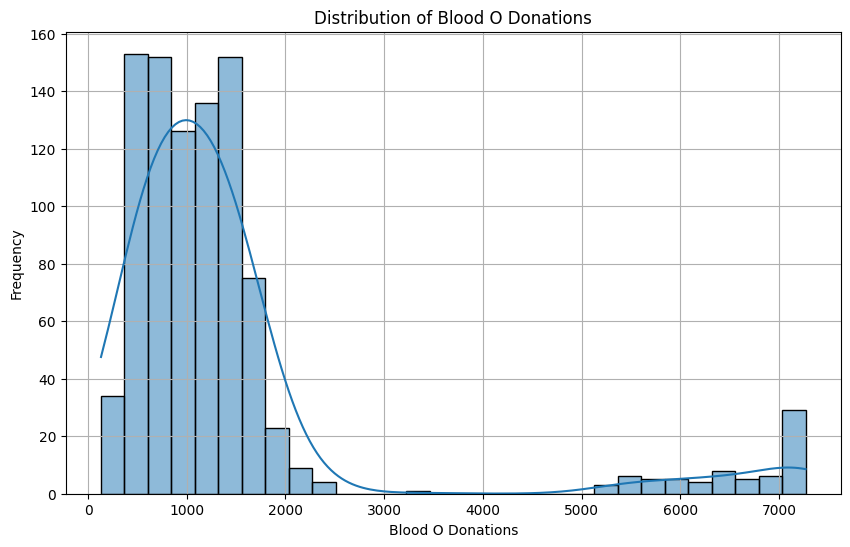

In [179]:
# Plot distribution of blood_o donations
plt.figure(figsize=(10, 6))
sns.histplot(merged_df['blood_o'], bins=30, kde=True)
plt.title('Distribution of Blood O Donations')
plt.xlabel('Blood O Donations')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [180]:
# Summary statistics for blood_o
blood_o_stats = merged_df['blood_o'].describe()
print(blood_o_stats)


count     936.000000
mean     1462.169316
std      1548.315223
min       131.000000
25%       678.750000
50%      1089.500000
75%      1466.500000
max      7269.880000
Name: blood_o, dtype: float64


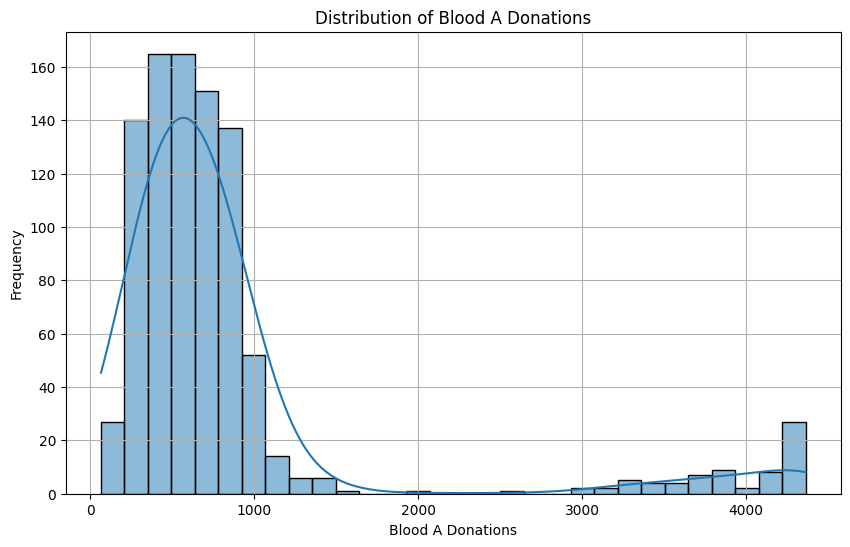

In [182]:
# Plot distribution of blood_o donations
plt.figure(figsize=(10, 6))
sns.histplot(merged_df['blood_a'], bins=30, kde=True)
plt.title('Distribution of Blood A Donations')
plt.xlabel('Blood A Donations')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

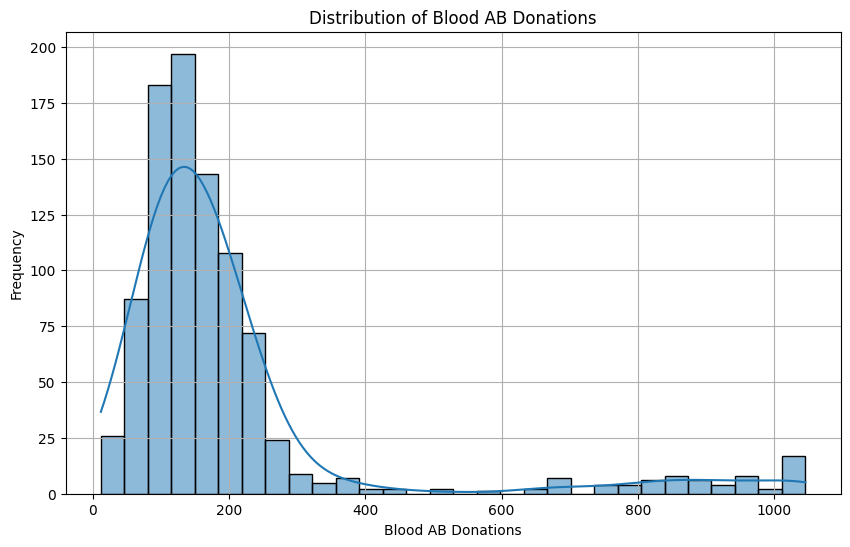

In [183]:
# Plot distribution of blood_o donations
plt.figure(figsize=(10, 6))
sns.histplot(merged_df['blood_ab'], bins=30, kde=True)
plt.title('Distribution of Blood AB Donations')
plt.xlabel('Blood AB Donations')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

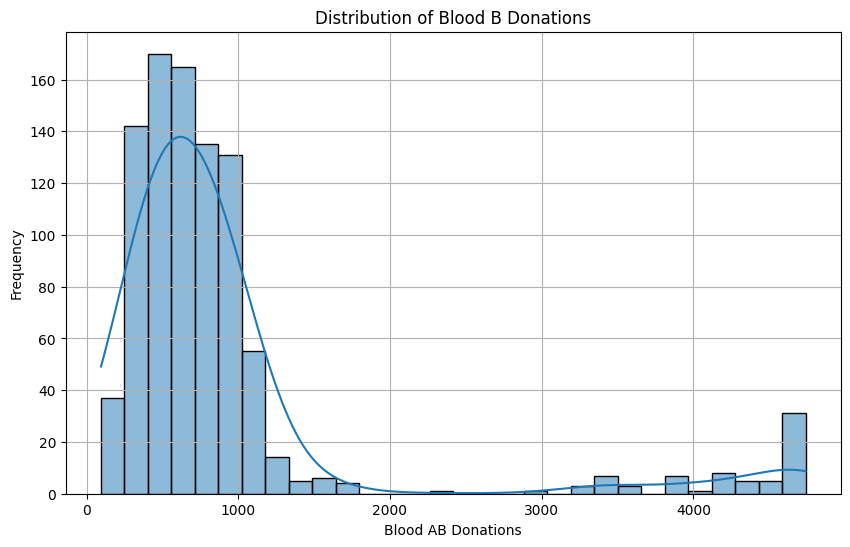

In [184]:
# Plot distribution of blood_o donations
plt.figure(figsize=(10, 6))
sns.histplot(merged_df['blood_b'], bins=30, kde=True)
plt.title('Distribution of Blood B Donations')
plt.xlabel('Blood AB Donations')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

***Managing the outliers again(adjusting the threshold/upper percentile) for every blood type until I get a lower MSE for every blood type 
and until the model performance is good***

In [185]:
# # Define a capping function for different thresholds (because of the imbalance data)
# def cap_outliers_individual(df, columns, thresholds):
#     for col in columns:
#         lower_bound = df[col].quantile(1 / 100)
#         upper_bound = df[col].quantile(thresholds[col] / 100)
#         df[col] = df[col].clip(lower=lower_bound, upper=upper_bound)
#     return df

# # Define custom thresholds for each blood type
# thresholds = {
#     'blood_a': 95,
#     'blood_ab': 95,
#     'blood_b': 90,
#     'blood_o': 85
# }

# # Cap the outliers for the blood types individually
# merged_df = cap_outliers_individual(merged_df, thresholds.keys(), thresholds)

# merged_df


***Decided to cap the outliers using IQR instead of customizing the upper percentile for a better model performance***

In [186]:
def cap_outliers_iqr(df, columns):
    for col in columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        df[col] = df[col].clip(lower=lower_bound, upper=upper_bound)
    return df

columns = ['blood_a','blood_b','blood_o','blood_ab']

merged_df = cap_outliers_iqr(merged_df, columns)

merged_df


,state,year,month,monthly_donations,blood_a,blood_b,blood_o,blood_ab,location_centre,location_mobile,social_civilian,social_student,social_policearmy,donations_new,donations_regular,donations_irregular,population,encoded_state
0,Johor,2018,1,3402,768.0,986.000,1450.000,198,3402,0,3263,126,13,1163,1612,627,29993.9,0
1,Johor,2018,2,2572,597.0,702.000,1152.000,121,2572,0,2416,146,10,933,1184,455,29993.9,0
2,Johor,2018,3,3213,777.0,874.000,1401.000,161,3213,0,3084,97,32,931,1677,605,29993.9,0
3,Johor,2018,4,3109,799.0,813.000,1350.000,147,3109,0,2961,101,47,968,1619,522,29993.9,0
4,Johor,2018,5,3113,784.0,790.000,1385.000,154,3113,0,2998,110,5,903,1644,566,29993.9,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
931,W.P. Kuala Lumpur,2023,8,17615,1487.0,1671.125,2648.125,355,3585,14030,15036,2318,261,3512,10767,3336,16046.2,12
932,W.P. Kuala Lumpur,2023,9,16466,1487.0,1671.125,2648.125,355,3911,12555,14431,1868,167,2853,10490,3123,16046.2,12
933,W.P. Kuala Lumpur,2023,10,16623,1487.0,1671.125,2648.125,355,3534,13089,14331,2146,146,3162,10104,3357,16046.2,12
934,W.P. Kuala Lumpur,2023,11,15401,1487.0,1671.125,2648.125,355,3236,12165,12922,2210,269,2912,9701,2788,16046.2,12


***Trying to combine both IQR method and customising the upper percentile***

In [187]:
# def cap_outliers_custom(df, columns, thresholds):
#     for col in columns:
#         # Calculate Q1 and Q3
#         Q1 = df[col].quantile(0.25)
#         Q3 = df[col].quantile(0.75)
#         IQR = Q3 - Q1
        
#         # Calculate lower and upper bounds using the thresholds
#         lower_bound = Q1 - 1.5 * IQR
#         upper_bound = df[col].quantile(thresholds[col] / 100)  # Custom upper bound
        
#         # Cap the values in the DataFrame
#         df[col] = df[col].clip(lower=lower_bound, upper=upper_bound)
    
#     return df

# # Define custom thresholds for each blood type
# thresholds = {
#     'blood_a': 75,
#     'blood_ab': 80,
#     'blood_b': 75,
#     'blood_o': 75
# }

# # Cap the outliers for the blood types individually
# merged_df = cap_outliers_custom(merged_df, thresholds.keys(), thresholds)


In [188]:
# Define the target variables (blood stock for the next month)
target_columns = ['blood_a', 'blood_ab', 'blood_b', 'blood_o']

# Define independent variables
feature_columns = ['year', 'month','encoded_state','population', 'location_centre', 'location_mobile',
                   'social_civilian', 'social_student', 'social_policearmy', 
                   'donations_new', 'donations_regular', 'donations_irregular']


# Separate features (X) and target variables (y)
X = merged_df[feature_columns]
y = merged_df[target_columns]

In [189]:
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [190]:
# Define models and their hyperparameter grids
model_grids = {
    'Linear Regression': (LinearRegression(), {}),
    'Random Forest Regressor': (RandomForestRegressor(random_state=42), {
        'estimator__n_estimators': [50, 100],
        'estimator__max_depth': [5, 10]
    }),
    'Support Vector Regressor': (SVR(), {
        'estimator__C': [0.1, 1, 10],
        'estimator__gamma': ['scale', 'auto']
    }),
    'Gradient Boosting Regressor': (GradientBoostingRegressor(random_state=42), {
        'estimator__n_estimators': [50, 100],
        'estimator__learning_rate': [0.01, 0.1, 0.2],
        'estimator__max_depth': [3, 5]
    }),
    'Decision Tree Regressor': (DecisionTreeRegressor(random_state=42), {
        'estimator__max_depth': [3, 5, 10]
    })
}

In [191]:
# Dictionary to store performance results
results = {}

# Hyperparameter tuning and evaluation
for name, (model, param_grid) in model_grids.items():
    multi_output_model = MultiOutputRegressor(model)
    
    # Setup GridSearchCV for hyperparameter tuning
    grid_search = GridSearchCV(multi_output_model, param_grid, cv=5, scoring='r2', n_jobs=-1)
    
    # Fit GridSearchCV
    grid_search.fit(X_train, y_train)
    
    # Get the best model
    best_model = grid_search.best_estimator_
    
    # Make predictions
    y_pred = best_model.predict(X_test)
    
    # Calculate evaluation metrics
    r2 = r2_score(y_test, y_pred)
    rmse = mean_squared_error(y_test, y_pred, squared=False)
    mae = mean_absolute_error(y_test, y_pred)
    
    # Store results
    results[name] = {
        'Best Hyperparameters': grid_search.best_params_,
        'R-squared': r2,
        'RMSE': rmse,
        'MAE': mae
    }

# Convert results to a DataFrame for better display
results_df = pd.DataFrame(results).T


C:\Program Files\Python312\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Program Files\Python312\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Program Files\Python312\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Program Files\Python312\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, 

In [192]:
# Display the results
print("Model Performance Results:")
print(results_df)

Model Performance Results:
                                                          Best Hyperparameters  \
Linear Regression                                                           {}   
Random Forest Regressor      {'estimator__max_depth': 10, 'estimator__n_est...   
Support Vector Regressor     {'estimator__C': 10, 'estimator__gamma': 'scale'}   
Gradient Boosting Regressor  {'estimator__learning_rate': 0.1, 'estimator__...   
Decision Tree Regressor                            {'estimator__max_depth': 5}   

                            R-squared        RMSE         MAE  
Linear Regression            0.859684  134.833873  102.816314  
Random Forest Regressor      0.985454   36.144277    24.62049  
Support Vector Regressor     0.668244  233.141387  178.043519  
Gradient Boosting Regressor  0.987174   31.421811   21.796212  
Decision Tree Regressor      0.970631   55.419321   39.650537  


***Retraining the few same models again and again, and choose the best model, then evaluate the MSE and R-square value for every blood type***

In [193]:
model = MultiOutputRegressor(GradientBoostingRegressor(random_state=42))
model.fit(X_train, y_train)

MultiOutputRegressor(estimator=GradientBoostingRegressor(random_state=42))

In [194]:
# Assuming you have split validation/test data
y_pred = model.predict(X_test)  # Predictions on validation data
y_pred_df = pd.DataFrame(y_pred, columns=['blood_a', 'blood_ab', 'blood_b', 'blood_o'])

for blood_type in ['blood_a', 'blood_ab', 'blood_b', 'blood_o']:
    mse = mean_squared_error(y_test[blood_type], y_pred_df[blood_type])
    r2 = r2_score(y_test[blood_type], y_pred_df[blood_type])
    print(blood_type + " - MSE: " + str(mse) + ", R²: " + str(r2))


blood_a - MSE: 737.6639180862385, R²: 0.9943855748357432
blood_ab - MSE: 271.34497857165087, R²: 0.9664215572961403
blood_b - MSE: 1077.0418370532811, R²: 0.9936512094577532
blood_o - MSE: 2424.223622474197, R²: 0.9942374909214783


***Examine Cross-Validation Results***

In [195]:
# Use cross_val_score to get an idea of model performance across folds
cv_scores = cross_val_score(model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')

# Convert negative MSE to positive
cv_scores = -cv_scores

# Output the results
print("Cross-Validation MSE Scores: " + str(cv_scores))
print("Mean CV MSE: " + str(cv_scores.mean()) + ", Std Dev: " + str(cv_scores.std()))


Cross-Validation MSE Scores: [1152.84457911 1506.06544578 1131.06065018 1157.05305812 1285.04732934]
Mean CV MSE: 1246.4142125049955, Std Dev: 140.68291808618596


***Testing the chosen model and visualise the data actual vs predicted output before finalizing the model selection***

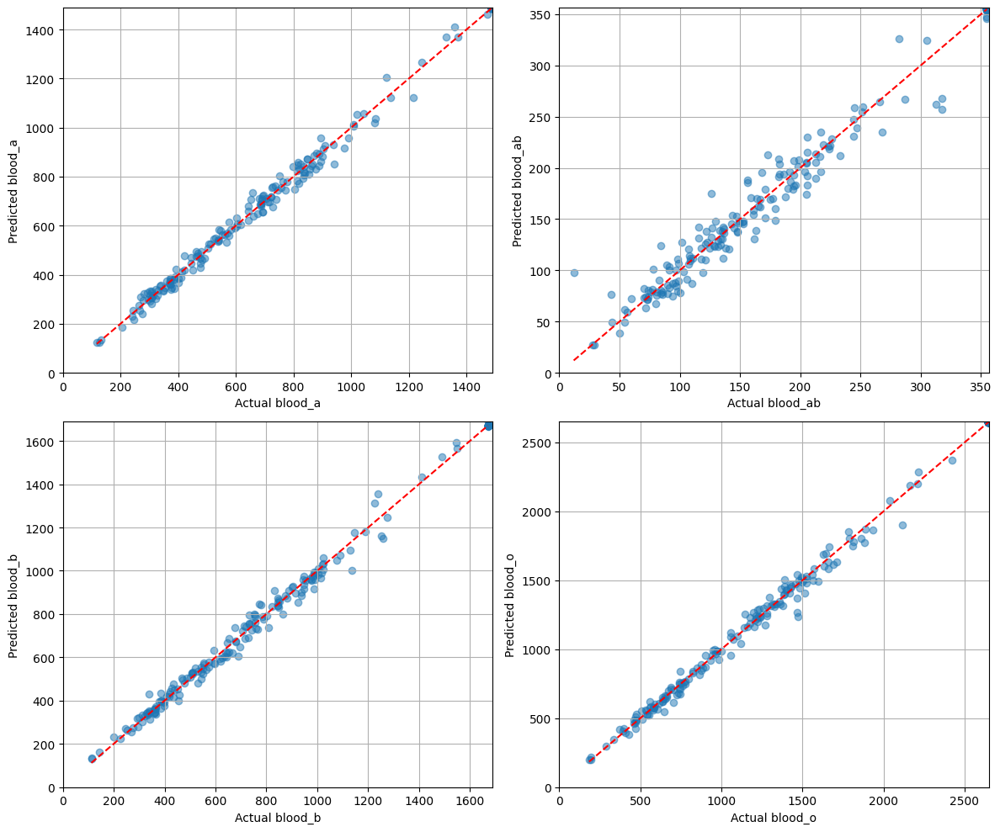

In [196]:
# Convert y_test and y_pred to DataFrames if they are not already
y_test_df = pd.DataFrame(y_test, columns=['blood_a', 'blood_ab', 'blood_b', 'blood_o'])
y_pred_df = pd.DataFrame(y_pred, columns=['blood_a', 'blood_ab', 'blood_b', 'blood_o'])

# For each blood type
blood_types = ['blood_a', 'blood_ab', 'blood_b', 'blood_o']

plt.figure(figsize=(12, 10))

for i, blood_type in enumerate(blood_types):
    plt.subplot(2, 2, i + 1)
    plt.scatter(y_test_df[blood_type], y_pred_df[blood_type], alpha=0.5)
    plt.plot([y_test_df[blood_type].min(), y_test_df[blood_type].max()], 
             [y_test_df[blood_type].min(), y_test_df[blood_type].max()], 'r--')  # Diagonal line
    plt.xlabel('Actual ' + blood_type)
    plt.ylabel('Predicted ' + blood_type)
    plt.xlim([0, max(y_test_df[blood_type].max(), y_pred_df[blood_type].max())])
    plt.ylim([0, max(y_test_df[blood_type].max(), y_pred_df[blood_type].max())])
    plt.grid(True)

plt.tight_layout()
plt.show()

In [197]:
#Gradient Boosting Regression has the highest R-squared value and lowest RMSE and MAE values

<h4>6.3 Model Demonstration and Visualization</h4>

***An esemble model of MultiOut Regressor and Gradient Boosting Regressor (using data frame with more features) is chosen because it has the best overall performance with the highest R², and the lowest RMSE and MAE***

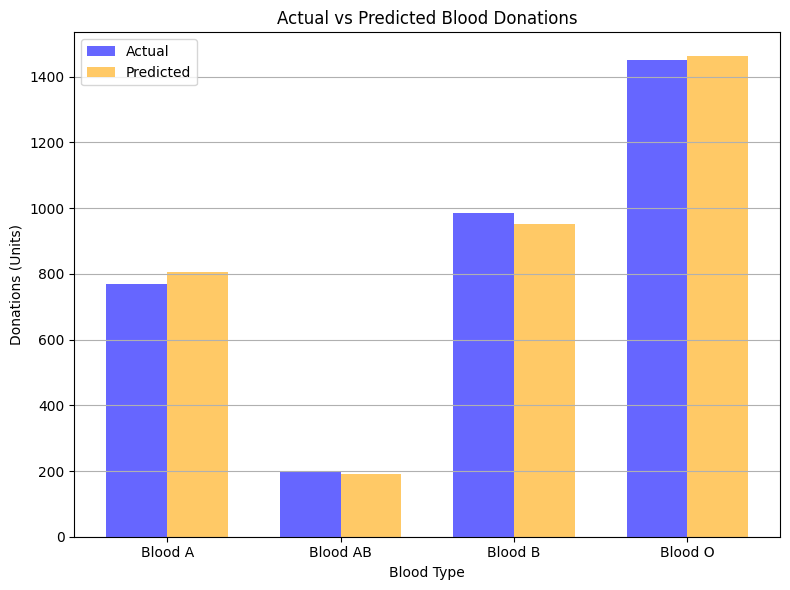

In [198]:
# Evaluating the model based on one set of inputs

# Extract the first row
first_row = merged_df.iloc[0]

# State mapping (already defined in your previous code)
state_mapping = {
    0: 'Johor', 1: 'Kedah', 2: 'Kelantan', 3: 'Melaka', 4: 'N. Sembilan', 
    5: 'Pahang', 6: 'Perak', 7: 'Penang', 8: 'Sabah', 
    9: 'Sarawak', 10: 'Selangor', 11: 'Terengganu', 12: 'W.P. Kuala Lumpur'
}

# Example input for future prediction (modify the values as needed)
custom_input = {
    'year': 2018,
    'month': 1,
    'encoded_state': 0,  # For Johor
    'population': 29993.9,
    'location_centre': 3402,
    'location_mobile': 0,
    'social_civilian': 3263,
    'social_student': 126,
    'social_policearmy': 13,
    'donations_new': 1163,
    'donations_regular': 1612,
    'donations_irregular': 627
}

# Create a DataFrame for input
user_input = pd.DataFrame([custom_input])

# Predict using the model
predictions = model.predict(user_input)
predictions_df = pd.DataFrame(predictions, columns=['blood_a', 'blood_ab', 'blood_b', 'blood_o']).round()

# Extract actual values from the first row for comparison
actual_values = first_row[['blood_a', 'blood_ab', 'blood_b', 'blood_o']]

# Prepare for plotting
blood_types = ['Blood A', 'Blood AB', 'Blood B', 'Blood O']
actual = actual_values.values
predicted = predictions_df.iloc[0].values

# Plot results
plt.figure(figsize=(8, 6))
bar_width = 0.35
index = range(len(blood_types))

# Create bar plots for actual and predicted values
plt.bar(index, actual, bar_width, label='Actual', color='blue', alpha=0.6)
plt.bar([i + bar_width for i in index], predicted, bar_width, label='Predicted', color='orange', alpha=0.6)

# Adding labels and title
plt.xlabel('Blood Type')
plt.ylabel('Donations (Units)')
plt.title('Actual vs Predicted Blood Donations')
plt.xticks([i + bar_width / 2 for i in index], blood_types)
plt.legend()
plt.grid(axis='y')
plt.tight_layout()
plt.show()


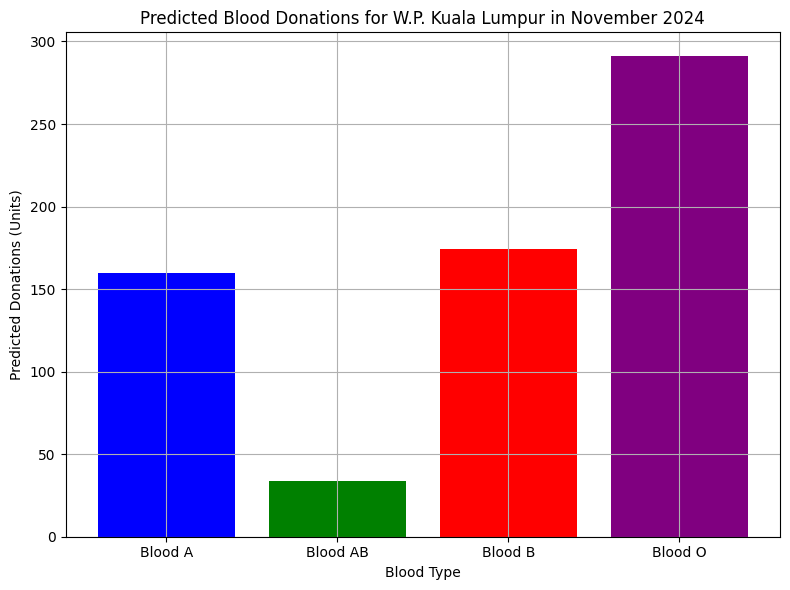

In [199]:
# State mapping
state_mapping = {
    0: 'Johor', 1: 'Kedah', 2: 'Kelantan', 3: 'Melaka', 4: 'N. Sembilan', 
    5: 'Pahang', 6: 'Perak', 7: 'Penang', 8: 'Sabah', 
    9: 'Sarawak', 10: 'Selangor', 11: 'Terengganu', 12: 'W.P. Kuala Lumpur'
}

# Example input for future prediction
user_input = pd.DataFrame({
    'year': [2024], 'month': [11], 'encoded_state': [12], 
    'population': [25000], 'location_centre': [300], 'location_mobile': [150],
    'social_civilian': [800], 'social_student': [20], 'social_policearmy': [10],
    'donations_new': [200], 'donations_regular': [100], 'donations_irregular': [50]
})

# Predict and format results
predictions = model.predict(user_input)
predictions_df = pd.DataFrame(predictions, columns=['blood_a', 'blood_ab', 'blood_b', 'blood_o']).round()

# Decode state and extract relevant info
encoded_state = user_input['encoded_state'][0]
state_name = state_mapping[encoded_state]
month = user_input['month'][0]
year = user_input['year'][0]

# Month names for labeling
month_names = {
    1: "January", 2: "February", 3: "March", 4: "April", 5: "May", 6: "June", 
    7: "July", 8: "August", 9: "September", 10: "October", 11: "November", 12: "December"
}

# Plot results
plt.figure(figsize=(8, 6))
blood_types = ['Blood A', 'Blood AB', 'Blood B', 'Blood O']
blood_values = predictions_df.iloc[0]

plt.bar(blood_types, blood_values, color=['blue', 'green', 'red', 'purple'])
plt.xlabel('Blood Type')
plt.ylabel('Predicted Donations (Units)')
plt.title('Predicted Blood Donations for ' + state_name + ' in ' + month_names[month] + ' ' + str(year))
plt.grid(True)
plt.tight_layout()
plt.show()


***Trying to understand the relationship between population and features like social_civilian, social_student, social_policearmy, donations_new, donations_regular, and donations_irregular to simpilify the data frame***

In [200]:
correlation_matrix = merged_df[['population', 'social_civilian', 'social_student', 'social_policearmy', 'donations_new', 'donations_regular', 'donations_irregular']].corr()
print(correlation_matrix)


                     population  social_civilian  social_student  \
population             1.000000        -0.004596       -0.122708   
social_civilian       -0.004596         1.000000        0.850411   
social_student        -0.122708         0.850411        1.000000   
social_policearmy     -0.136381         0.683955        0.783331   
donations_new         -0.025526         0.936314        0.923612   
donations_regular     -0.039791         0.992815        0.869814   
donations_irregular   -0.004487         0.977286        0.885304   

                     social_policearmy  donations_new  donations_regular  \
population                   -0.136381      -0.025526          -0.039791   
social_civilian               0.683955       0.936314           0.992815   
social_student                0.783331       0.923612           0.869814   
social_policearmy             1.000000       0.769935           0.708621   
donations_new                 0.769935       1.000000           0.920754   

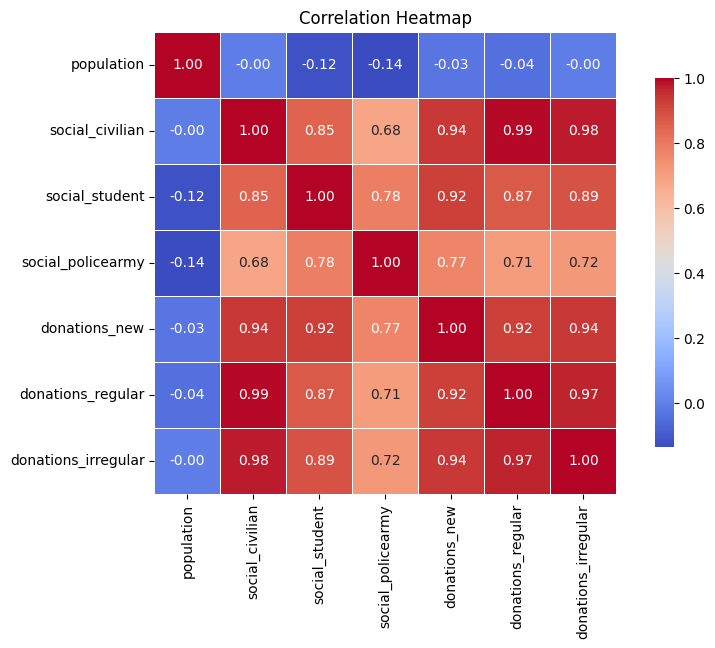

In [201]:
correlation_matrix = merged_df[['population', 'social_civilian', 'social_student', 
                                   'social_policearmy', 'donations_new', 
                                   'donations_regular', 'donations_irregular']].corr()

# Set up the matplotlib figure
plt.figure(figsize=(10, 6))

# Create a heatmap
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', 
            square=True, linewidths=0.5, cbar_kws={"shrink": .8})

# Set the title
plt.title('Correlation Heatmap')

# Show the plot
plt.show()

***-decided to combine the features('social_civilian', 'social_student', 'social_policearmy', 'donations_new', 'donations_regular', 'donations_irregular') into a single column to simplify the model,
as we will not be having the prediction models for all independent variables that need to have their own future values as the inputs***

In [227]:
from sklearn.preprocessing import StandardScaler

# Define the features you want to apply PCA to
social_features = ['social_civilian', 'social_student', 'social_policearmy']
donation_features = ['donations_new', 'donations_regular', 'donations_irregular']
location = ['location_centre', 'location_mobile']

# Standardize the features
scaler = StandardScaler()

# Assuming your data is in a DataFrame called df
social_scaled = scaler.fit_transform(merged_df[social_features])
donation_scaled = scaler.fit_transform(merged_df[donation_features])
location_scaled = scaler.fit_transform(merged_df[location])



In [228]:
from sklearn.decomposition import PCA

# Apply PCA to social features
pca_social = PCA(n_components=0.95)  # Retain 95% of variance
social_pca = pca_social.fit_transform(social_scaled)

# Apply PCA to donation features
pca_donation = PCA(n_components=0.95)
donation_pca = pca_donation.fit_transform(donation_scaled)

pca_location = PCA(n_components=0.95)
location_pca = pca_location.fit_transform(location_scaled)


In [229]:
# Explained variance for social features
print("Explained variance for social features:", pca_social.explained_variance_ratio_)

# Explained variance for donation features
print("Explained variance for donation features:", pca_donation.explained_variance_ratio_)

print("Explained variance for location features:", pca_location.explained_variance_ratio_)


Explained variance for social features: [0.84904088 0.10781248]
Explained variance for donation features: [0.96068065]
Explained variance for location features: [0.65974461 0.34025539]


In [233]:
import pandas as pd

# Convert the PCA results into a DataFrame
# If you decide to keep both PC1 and PC2 for social features:
social_pca_df = pd.DataFrame(social_pca, columns=['social_PC1', 'social_PC2'])

# For donation features (only PC1):
donation_pca_df = pd.DataFrame(donation_pca, columns=['donation_PC1'])

location_pca_df = pd.DataFrame(location_pca, columns=['location_PC1', 'location_PC2'])

# Reset the index of merged_df to ensure alignment with PCA DataFrames
merged_df.reset_index(drop=True, inplace=True)

# Concatenate the new PCA columns back into merged_df
merged_df_pca = pd.concat([merged_df, social_pca_df, donation_pca_df, location_pca_df], axis=1)

# Drop the original social and donation features (optional)
merged_df_pca = merged_df_pca.drop(columns=social_features + donation_features + location)


In [234]:
merged_df_pca

,state,year,month,monthly_donations,blood_a,blood_b,blood_o,blood_ab,population,encoded_state,normalized_total_social,social_PC1,social_PC2,donation_PC1,location_PC1,location_PC2
0,Johor,2018,1,3402,768.0,986.000,1450.000,198,29993.9,0,0.646563,-0.487164,-0.357843,0.131795,0.677891,1.686291
1,Johor,2018,2,2572,597.0,702.000,1152.000,121,29993.9,0,0.486314,-0.634578,-0.213000,-0.265003,0.225828,1.234229
2,Johor,2018,3,3213,777.0,874.000,1401.000,161,29993.9,0,0.601937,-0.485296,-0.227620,-0.025039,0.574951,1.583352
3,Johor,2018,4,3109,799.0,813.000,1350.000,147,29993.9,0,0.588669,-0.454558,-0.134954,-0.077709,0.518307,1.526708
4,Johor,2018,5,3113,784.0,790.000,1385.000,154,29993.9,0,0.566650,-0.578070,-0.339956,-0.082016,0.520486,1.528886
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
931,W.P. Kuala Lumpur,2023,8,17615,1487.0,1671.125,2648.125,355,16046.2,12,3.659171,4.620927,-2.016333,6.146086,3.922063,-1.358537
932,W.P. Kuala Lumpur,2023,9,16466,1487.0,1671.125,2648.125,355,16046.2,12,3.294095,3.764927,-2.226807,5.467042,3.769033,-0.850393
933,W.P. Kuala Lumpur,2023,10,16623,1487.0,1671.125,2648.125,355,16046.2,12,3.402145,3.944364,-2.373527,5.752672,3.683382,-1.175411
934,W.P. Kuala Lumpur,2023,11,15401,1487.0,1671.125,2648.125,355,16046.2,12,3.208377,4.152340,-1.543925,5.049118,3.313982,-1.130625


In [202]:
# from sklearn.preprocessing import MinMaxScaler

# # normalization is for preventing features with larger scales from dominating the sum
# scaler = MinMaxScaler()

# scaled_features = scaler.fit_transform(merged_df[['social_civilian', 'social_student', 'social_policearmy', 'donations_new', 'donations_regular', 'donations_irregular']])
# merged_df['normalized_total_social'] = scaled_features.sum(axis=1)


In [203]:
merged_df

,state,year,month,monthly_donations,blood_a,blood_b,blood_o,blood_ab,location_centre,location_mobile,social_civilian,social_student,social_policearmy,donations_new,donations_regular,donations_irregular,population,encoded_state,normalized_total_social
0,Johor,2018,1,3402,768.0,986.000,1450.000,198,3402,0,3263,126,13,1163,1612,627,29993.9,0,0.646563
1,Johor,2018,2,2572,597.0,702.000,1152.000,121,2572,0,2416,146,10,933,1184,455,29993.9,0,0.486314
2,Johor,2018,3,3213,777.0,874.000,1401.000,161,3213,0,3084,97,32,931,1677,605,29993.9,0,0.601937
3,Johor,2018,4,3109,799.0,813.000,1350.000,147,3109,0,2961,101,47,968,1619,522,29993.9,0,0.588669
4,Johor,2018,5,3113,784.0,790.000,1385.000,154,3113,0,2998,110,5,903,1644,566,29993.9,0,0.566650
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
931,W.P. Kuala Lumpur,2023,8,17615,1487.0,1671.125,2648.125,355,3585,14030,15036,2318,261,3512,10767,3336,16046.2,12,3.659171
932,W.P. Kuala Lumpur,2023,9,16466,1487.0,1671.125,2648.125,355,3911,12555,14431,1868,167,2853,10490,3123,16046.2,12,3.294095
933,W.P. Kuala Lumpur,2023,10,16623,1487.0,1671.125,2648.125,355,3534,13089,14331,2146,146,3162,10104,3357,16046.2,12,3.402145
934,W.P. Kuala Lumpur,2023,11,15401,1487.0,1671.125,2648.125,355,3236,12165,12922,2210,269,2912,9701,2788,16046.2,12,3.208377


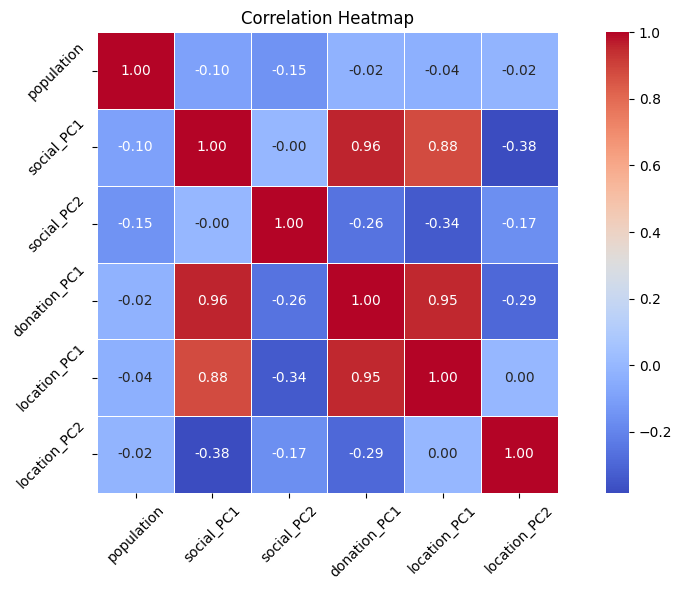

In [248]:
heatmap_data = merged_df_pca[['population', 'social_PC1', 'social_PC2', 'donation_PC1', 'location_PC1', 'location_PC2']]

# Calculate the correlation matrix
correlation_matrix = heatmap_data.corr()

# Create the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", square=True, linewidths=0.5)

# Title and labels
plt.title('Correlation Heatmap')
plt.xticks(rotation=45)
plt.yticks(rotation=45)
plt.tight_layout()

# Show the heatmap
plt.show()

In [204]:
subset_df = merged_df[['state', 'year', 'month', 'blood_a', 'blood_b', 'blood_o', 'blood_ab', 
                       'location_centre', 'location_mobile', 'population', 'encoded_state', 'normalized_total_social' ]]

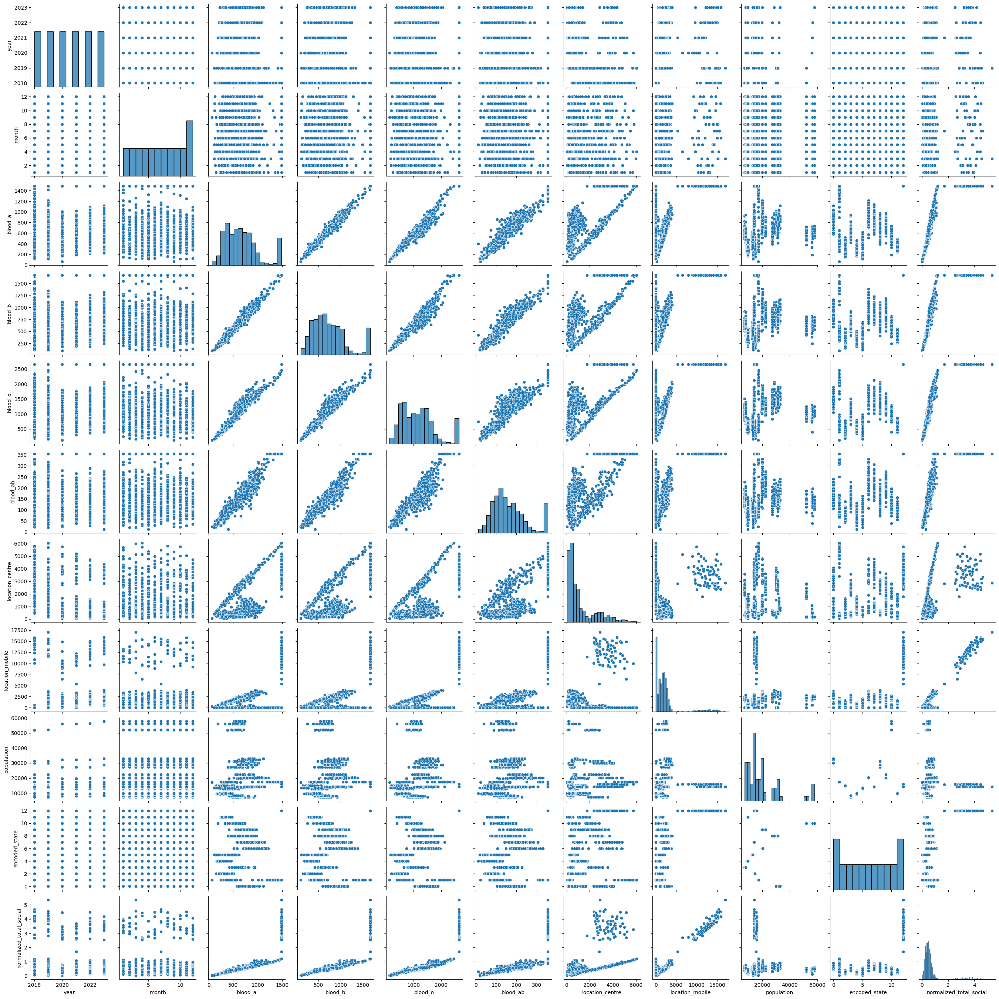

In [205]:
sns.pairplot(subset_df)
plt.show()

***Re-Training a few models using latest data frame (using the new normalized_total_social column)***

In [235]:
# Define the target variables (blood stock for the next month)
target_columns = ['blood_a', 'blood_ab', 'blood_b', 'blood_o']

# Define independent variables
feature_columns = ['year', 'month','encoded_state','population', 'location_PC1', 'location_PC2','social_PC1', 'social_PC2',
                   'donation_PC1']


# Separate features (X) and target variables (y)
X = merged_df_pca[feature_columns]
y = merged_df_pca[target_columns]

In [236]:

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



In [237]:
# Define models and their hyperparameter grids
model_grids = {
    'Linear Regression': (LinearRegression(), {}),
    'Random Forest Regressor': (RandomForestRegressor(random_state=42), {
        'estimator__n_estimators': [50, 100],
        'estimator__max_depth': [5, 10]
    }),
    'Support Vector Regressor': (SVR(), {
        'estimator__C': [0.1, 1, 10],
        'estimator__gamma': ['scale', 'auto']
    }),
    'Gradient Boosting Regressor': (GradientBoostingRegressor(random_state=42), {
        'estimator__n_estimators': [50, 100],
        'estimator__learning_rate': [0.01, 0.1, 0.2],
        'estimator__max_depth': [3, 5]
    }),
    'Decision Tree Regressor': (DecisionTreeRegressor(random_state=42), {
        'estimator__max_depth': [3, 5, 10]
    })
}




In [238]:
# Dictionary to store performance results
results = {}

# Hyperparameter tuning and evaluation
for name, (model, param_grid) in model_grids.items():
    multi_output_model = MultiOutputRegressor(model)
    
    # Setup GridSearchCV for hyperparameter tuning
    grid_search = GridSearchCV(multi_output_model, param_grid, cv=5, scoring='r2', n_jobs=-1)
    
    # Fit GridSearchCV
    grid_search.fit(X_train, y_train)
    
    # Get the best model
    best_model = grid_search.best_estimator_
    
    # Make predictions
    y_pred = best_model.predict(X_test)
    
    # Calculate evaluation metrics
    r2 = r2_score(y_test, y_pred)
    rmse = mean_squared_error(y_test, y_pred, squared=False)
    mae = mean_absolute_error(y_test, y_pred)
    
    # Store results
    results[name] = {
        'Best Hyperparameters': grid_search.best_params_,
        'R-squared': r2,
        'RMSE': rmse,
        'MAE': mae
    }

# Convert results to a DataFrame for better display
results_df = pd.DataFrame(results).T


C:\Program Files\Python312\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Program Files\Python312\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Program Files\Python312\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Program Files\Python312\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, 

In [239]:
# Display the results
print("Model Performance Results:")
print(results_df)

Model Performance Results:
                                                          Best Hyperparameters  \
Linear Regression                                                           {}   
Random Forest Regressor      {'estimator__max_depth': 10, 'estimator__n_est...   
Support Vector Regressor     {'estimator__C': 10, 'estimator__gamma': 'scale'}   
Gradient Boosting Regressor  {'estimator__learning_rate': 0.1, 'estimator__...   
Decision Tree Regressor                            {'estimator__max_depth': 5}   

                            R-squared        RMSE         MAE  
Linear Regression            0.814748  158.516161  129.037776  
Random Forest Regressor      0.986469   34.617291   24.754226  
Support Vector Regressor     0.045248  369.959474  257.392561  
Gradient Boosting Regressor  0.987186   34.384499   25.509752  
Decision Tree Regressor      0.974742    52.83666   38.867728  


In [240]:
model = MultiOutputRegressor(GradientBoostingRegressor(random_state=42))
model.fit(X_train, y_train)

MultiOutputRegressor(estimator=GradientBoostingRegressor(random_state=42))

In [241]:
# Assuming you have split validation/test data
y_pred = model.predict(X_test)  # Predictions on validation data
y_pred_df = pd.DataFrame(y_pred, columns=['blood_a', 'blood_ab', 'blood_b', 'blood_o'])

for blood_type in ['blood_a', 'blood_ab', 'blood_b', 'blood_o']:
    mse = mean_squared_error(y_test[blood_type], y_pred_df[blood_type])
    r2 = r2_score(y_test[blood_type], y_pred_df[blood_type])
    print(blood_type + " - MSE: " + str(mse) + ", R²: " + str(r2))

blood_a - MSE: 988.4184179385356, R²: 0.9924770602134287
blood_ab - MSE: 234.0208757371319, R²: 0.9710403464666608
blood_b - MSE: 1293.6240053287859, R²: 0.9923745321976304
blood_o - MSE: 3006.7837581598847, R²: 0.9928527143523731


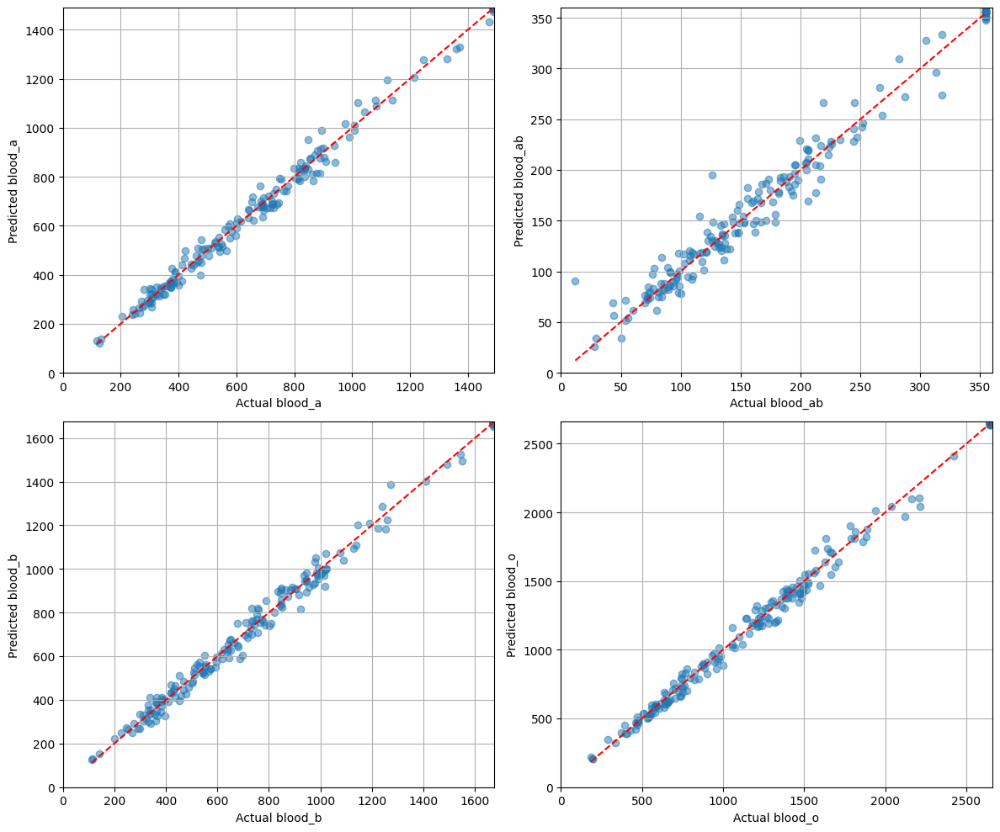

In [242]:
# Convert y_test and y_pred to DataFrames if they are not already
y_test_df = pd.DataFrame(y_test, columns=['blood_a', 'blood_ab', 'blood_b', 'blood_o'])
y_pred_df = pd.DataFrame(y_pred, columns=['blood_a', 'blood_ab', 'blood_b', 'blood_o'])

# For each blood type
blood_types = ['blood_a', 'blood_ab', 'blood_b', 'blood_o']

plt.figure(figsize=(12, 10))

for i, blood_type in enumerate(blood_types):
    plt.subplot(2, 2, i + 1)
    plt.scatter(y_test_df[blood_type], y_pred_df[blood_type], alpha=0.5)
    plt.plot([y_test_df[blood_type].min(), y_test_df[blood_type].max()], 
             [y_test_df[blood_type].min(), y_test_df[blood_type].max()], 'r--')  # Diagonal line
    plt.xlabel('Actual ' + blood_type)
    plt.ylabel('Predicted ' + blood_type)
    plt.xlim([0, max(y_test_df[blood_type].max(), y_pred_df[blood_type].max())])
    plt.ylim([0, max(y_test_df[blood_type].max(), y_pred_df[blood_type].max())])
    plt.grid(True)

plt.tight_layout()
plt.show()

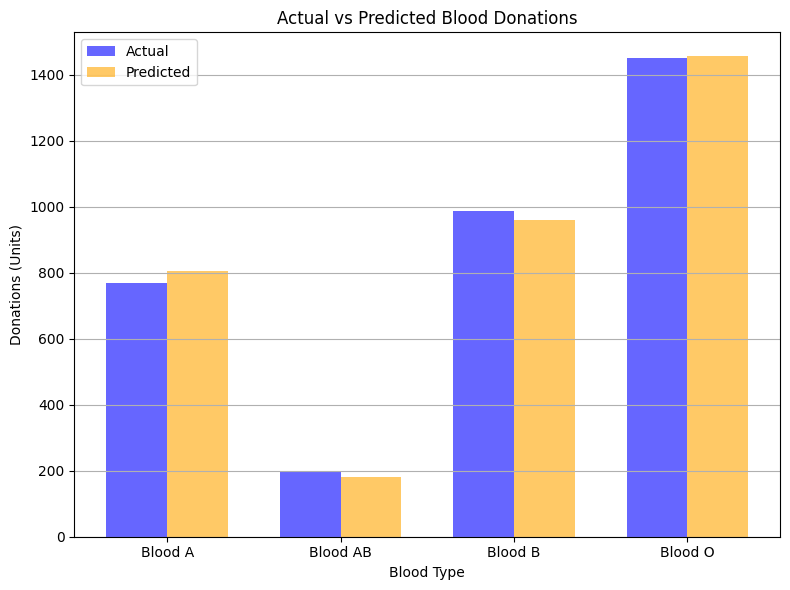

In [245]:
# Evaluating the model based on one set of inputs

# Extract the first row
first_row = merged_df_pca.iloc[0]

# State mapping (already defined in your previous code)
state_mapping = {
    0: 'Johor', 1: 'Kedah', 2: 'Kelantan', 3: 'Melaka', 4: 'N. Sembilan', 
    5: 'Pahang', 6: 'Perak', 7: 'Penang', 8: 'Sabah', 
    9: 'Sarawak', 10: 'Selangor', 11: 'Terengganu', 12: 'W.P. Kuala Lumpur'
}

# Example input 
custom_input = {
    'year': 2018,
    'month': 1,
    'encoded_state': 0,  # For Johor
    'population': 29993.9,
    'location_PC1': 0.677891,
    'location_PC2': 1.686291,
    'social_PC1': -0.487164,
    'social_PC2': -0.357843,
    'donation_PC1': 0.131795

}

				

# Create a DataFrame for input
user_input = pd.DataFrame([custom_input])

# Predict using the model
predictions = model.predict(user_input)
predictions_df = pd.DataFrame(predictions, columns=['blood_a', 'blood_ab', 'blood_b', 'blood_o']).round()

# Extract actual values from the first row for comparison
actual_values = first_row[['blood_a', 'blood_ab', 'blood_b', 'blood_o']]

# Prepare for plotting
blood_types = ['Blood A', 'Blood AB', 'Blood B', 'Blood O']
actual = actual_values.values
predicted = predictions_df.iloc[0].values

# Plot results
plt.figure(figsize=(8, 6))
bar_width = 0.35
index = range(len(blood_types))

# Create bar plots for actual and predicted values
plt.bar(index, actual, bar_width, label='Actual', color='blue', alpha=0.6)
plt.bar([i + bar_width for i in index], predicted, bar_width, label='Predicted', color='orange', alpha=0.6)

# Adding labels and title
plt.xlabel('Blood Type')
plt.ylabel('Donations (Units)')
plt.title('Actual vs Predicted Blood Donations')
plt.xticks([i + bar_width / 2 for i in index], blood_types)
plt.legend()
plt.grid(axis='y')
plt.tight_layout()
plt.show()


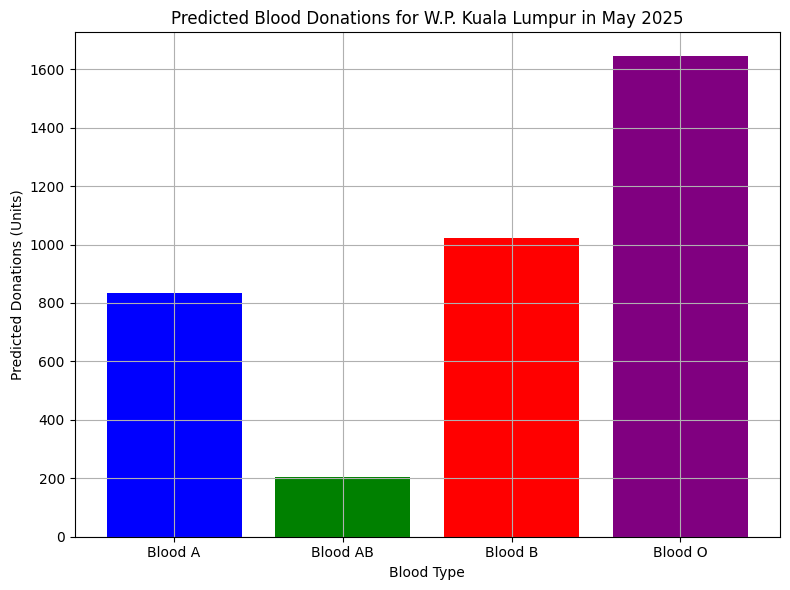

In [246]:
# State mapping
state_mapping = {
    0: 'Johor', 1: 'Kedah', 2: 'Kelantan', 3: 'Melaka', 4: 'N. Sembilan', 
    5: 'Pahang', 6: 'Perak', 7: 'Penang', 8: 'Sabah', 
    9: 'Sarawak', 10: 'Selangor', 11: 'Terengganu', 12: 'W.P. Kuala Lumpur'
}

# Example input for future prediction
user_input = pd.DataFrame({
    'year': [2025], 'month': [5], 'encoded_state': [12], 
    'population': [25000], 'location_PC1': [0.677891],
    'location_PC2': [1.686291],
    'social_PC1': [-0.487164],
    'social_PC2': [-0.357843],
    'donation_PC1': [0.131795]
})

# Predict and format results
predictions = model.predict(user_input)
predictions_df = pd.DataFrame(predictions, columns=['blood_a', 'blood_ab', 'blood_b', 'blood_o']).round()

# Decode state and extract relevant info
encoded_state = user_input['encoded_state'][0]
state_name = state_mapping[encoded_state]
month = user_input['month'][0]
year = user_input['year'][0]

# Month names for labeling
month_names = {
    1: "January", 2: "February", 3: "March", 4: "April", 5: "May", 6: "June", 
    7: "July", 8: "August", 9: "September", 10: "October", 11: "November", 12: "December"
}

# Plot results
plt.figure(figsize=(8, 6))
blood_types = ['Blood A', 'Blood AB', 'Blood B', 'Blood O']
blood_values = predictions_df.iloc[0]

plt.bar(blood_types, blood_values, color=['blue', 'green', 'red', 'purple'])
plt.xlabel('Blood Type')
plt.ylabel('Predicted Donations (Units)')
plt.title('Predicted Blood Donations for ' + state_name + ' in ' + month_names[month] + ' ' + str(year))
plt.grid(True)
plt.tight_layout()
plt.show()


In [216]:
# Now, the output is finally making sense

<h3>7. MODEL DEPLOYMENT TO WEB SYSTEM</h3>

In [217]:
# import pickle

# with open('model.pkl', 'wb') as model_file:
#     pickle.dump(model, model_file)


<h2>8. CONCLUSION</h2>

In this project, we aimed to develop a forecasting model for predicting number of blood donation/number of supply units for different blood types across various states in Malaysia on a monthly basis. By utilizing historical donation data and relevant features, the model provides insights into donation trends, which are crucial for effective resource planning and campaign management.

<h4>8.1 Summary Findings</h4>

#### 8.1.1 Blood Donation Trends

Analysis of the historical donation data revealed that blood type O consistently had the highest donations across all states and years. This trend was observed in various models and confirmed the hypothesis that blood type O is the most frequently donated blood type.

#### 8.1.2 Model Training and Evaluation

**Concept 1:** To predict the blood supply (ratio of donations) for each blood type, 4 same models were chosen from 5 models, one for each blood type (Type A, Type B, Type AB, and Type O). The models evaluated included:
1. Linear Regression
2. Decision Tree Regressor
3. Random Forest Regressor
4. Support Vector Regressor
5. Gradient Boosting Regressor

**Concept 2:** The project also explored multi-output prediction models that can forecast multiple blood types simultaneously. The models involved were:
1. Gradient Boosting Regressor
2. Support Vector Regressor
3. Random Forest Regressor
4. MultiOutputRegressor

**Concept 3:** The project also explored more datasets that can add more features and increase the R-squared value. The models involved were the MultiOut Regressor ensembled with:
1. Linear Regressor
2. Gradient Boosting Regressor
3. Support Vector Regressor
4. Random Forest Regressor
5. Decision Tree Regressor

#### 8.1.3 Best Model

The stacked ensemble model, combining Gradient Boosting Regressor and MultiOut Regressor, demonstrated the best performance. This model achieved the highest R-squared value and MAE value

#### 8.1.4 Model Performance

The chosen stacked ensemble model provided a robust and reliable forecasting solution, effectively predicting blood donation units for each blood type and maintaining consistent performance across different states and time periods.


<h4>8.2 Future Work</h4>

1. **Predict Population of a State for a Month/Year Using Time Series Models**  
   Develop and implement time series models to forecast the population of each state for specific months and years. Potential models include:
   - **ARIMA (AutoRegressive Integrated Moving Average)**: Captures trends and seasonality.
   - **SARIMA (Seasonal ARIMA)**: Handles seasonal patterns effectively.
   - **Exponential Smoothing (ETS)**: Includes methods like Holt-Winters for trend and seasonality forecasting.
   - **LSTM (Long Short-Term Memory) Networks**: Suitable for capturing complex temporal patterns.


2. **Obtain More Data About the Population of Every Blood Type**  
   Collect and analyze detailed data on the distribution of different blood types within the population. This data can provide valuable context for predicting donation trends and planning more effective blood donation campaigns. Consider gathering information such as:
   - **Proportions of Blood Types**: Percentages of each blood type in various regions.
   - **Trends Over Time**: Changes in blood type distribution across different time periods.

3. **Create separate prediction models for features that have significant temporal variability**
   - **number of social student,number of mobile location,number of new donor, etc**
   - **population**
   
   This could involve training models specifically for these features based on their historical data.